# CenterResnet Starter


I am very new to these concepts so I am trying out by changing this amazing and probably only 3D model related awesome public kernel by Ruslan
https://www.kaggle.com/hocop1/centernet-baseline

Most of the codes are loaned from there . There are other codes that I took from OFT implementation github . But I dont know what is OFT , so I have not yet implemented it . 

My current score is not from this kernel( as there are some errors in this kernel) , but from some simple architecture modification of the original public kernel. 


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

In [2]:
## Constants
SWITCH_LOSS_EPOCH = 5

# Load data

In [3]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

In [4]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

#plt.figure(figsize=(15,8))
#plt.imshow(img);

In [5]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [6]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

In [7]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

#plt.figure(figsize=(15,6))
#sns.countplot(lens);
#plt.xlabel('Number of cars in image');

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

In [8]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[rotate(c['roll'], np.pi) for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('roll rotated by pi')
# plt.show()

# 2D Visualization

In [9]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

#plt.figure(figsize=(14,14))
#plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
#plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

In [10]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

# Image preprocessing

In [11]:
IMG_WIDTH = 2048
IMG_HEIGHT = IMG_WIDTH // 4
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] //2 :]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

# PyTorch Dataset

In [12]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        
        return [img, mask, regr]
    
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

In [13]:
BATCH_SIZE = 4

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

In [14]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1):
        super(BasicBlock, self).__init__()

        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.GroupNorm(16, planes)

        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.GroupNorm(16, planes)

        if stride != 1 or inplanes != planes:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes, stride), nn.GroupNorm(16, planes))
        else:
            self.downsample = None


    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = self.bn2(self.conv2(out))

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out, inplace=True)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.GroupNorm(16, planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.GroupNorm(16, planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.GroupNorm(16, planes * self.expansion)

        if stride != 1 or inplanes != planes * self.expansion:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes * self.expansion, stride), 
                nn.GroupNorm(16, planes * self.expansion))
        else:
            self.downsample = None

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = F.relu(self.bn2(self.conv2(out)), inplace=True)
        out = self.bn3(self.conv3(out))
 
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out)

        return out


class ResNetFeatures(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNetFeatures, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.GroupNorm(16, 64)

        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):

        layers = []
        layers.append(block(self.inplanes, planes, stride))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)


    def forward(self, x):
        conv1 = F.relu(self.bn1(self.conv1(x)), inplace=True)
        conv1 = F.max_pool2d(conv1, 3, stride=2, padding=1)

        feats4 = self.layer1(conv1)
        feats8 = self.layer2(feats4)
        feats16 = self.layer3(feats8)
        feats32 = self.layer4(feats16)

        return feats8, feats16, feats32


def resnet18(pretrained=False, **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [2, 2, 2, 2], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet18']))
    return model



def resnet34(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet50(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet101(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 23, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model

def _load_pretrained(model, pretrained):
    model_dict = model.state_dict()
    pretrained = {k : v for k, v in pretrained.items() if k in model_dict}
    model_dict.update(pretrained)
    model.load_state_dict(model_dict)

In [15]:
class CentResnet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(CentResnet, self).__init__()
        self.base_model = resnet18(pretrained=False)
        
        # Lateral layers convert resnet outputs to a common feature size
        self.lat8 = nn.Conv2d(128, 256, 1)
        self.lat16 = nn.Conv2d(256, 256, 1)
        self.lat32 = nn.Conv2d(512, 256, 1)
        self.bn8 = nn.GroupNorm(16, 256)
        self.bn16 = nn.GroupNorm(16, 256)
        self.bn32 = nn.GroupNorm(16, 256)

       
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 , 512) #+ 1024
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)
        
    
    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        #feats = self.base_model.extract_features(x)
                # Run frontend network
        feats8, feats16, feats32 = self.base_model(x)
        lat8 = F.relu(self.bn8(self.lat8(feats8)))
        lat16 = F.relu(self.bn16(self.lat16(feats16)))
        lat32 = F.relu(self.bn32(self.lat32(feats32)))
        
        # Add positional info
        mesh2 = get_mesh(batch_size, lat32.shape[2], lat32.shape[3])
        feats = torch.cat([lat32, mesh2], 1)
        #print(feats.shape)
        #print (x4.shape)
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [16]:
from dlav0 import get_pose_net as get_dlav0
#from pose_dla_dcn import get_pose_net as get_dlav0

In [17]:
_model_factory = {
  #'res': get_pose_net, # default Resnet with deconv
  'dlav0': get_dlav0, # default DLAup
  #'dla': get_dla_dcn,
  #'resdcn': get_pose_net_dcn,
  #'hourglass': get_large_hourglass_net,
}

In [18]:
def create_model(arch, heads, head_conv):
    num_layers = int(arch[arch.find('_') + 1:]) if '_' in arch else 0
    arch = arch[:arch.find('_')] if '_' in arch else arch
    arch = 'dlav0'
    get_model = _model_factory[arch]
    model = get_model(num_layers=num_layers, heads=heads, head_conv=head_conv)
    return model

In [19]:
model = create_model('dla_34', {'hm': 1, 'reg' : 7} , 256)#{'hm': 3, 'dep': 1, 'rot': 8, 'dim': 3, 'wh': 2, 'reg': 2},256)

In [20]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 12 #6

#model = CentResnet(8).to(device)
model.cuda()
optimizer = optim.AdamW(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
#optimizer =  optim.Adam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [21]:
# Load Model

In [22]:
# model.load_state_dict(torch.load('./model-dla34_w08.pth'))
# model.eval();

In [23]:
def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)
def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h
def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0] + 0.5)
    mu_y = int(center[1] + 0.5)
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap

def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-1, y-1, x+1, y+1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))    
        ct = np.array([x,y], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, radius) # np.exp((y-5)/200)

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm



In [24]:
# from tqdm import tqdm
# def apply_gaussian(dataset):
#     for i in tqdm(range(len(dataset))):
#         dataset[i][1] = gaussian_mask(dataset[i][1])    
#     return dataset

# train_dataset = apply_gaussian(train_dataset)

# Training

In [25]:
def train(epoch, history=None):
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        
        if epoch < SWITCH_LOSS_EPOCH :
            loss, mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,1)
        else:
            loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5)  
        
        t.set_description(f'train_loss (l={loss:.3f})(m={mask_loss:.2f}) (r={regr_loss:.4f}')
        
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()

    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < SWITCH_LOSS_EPOCH :
                loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,1, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data
            else :
                loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [32]:
def _neg_loss(pred, gt):
    ''' Modified focal loss. Exactly the same as CornerNet.
      Runs faster and costs a little bit more memory
    Arguments:
      pred (batch x c x h x w)
      gt_regr (batch x c x h x w)
    '''
    pos_inds = gt.eq(1).float()
    neg_inds = gt.lt(1).float()

    neg_weights = torch.pow(1 - gt, 4)

    loss = 0

    pos_loss = torch.log(pred) * torch.pow(1 - pred, 2) * pos_inds
    neg_loss = torch.log(1 - pred) * torch.pow(pred, 2) * neg_weights * neg_inds

    num_pos  = pos_inds.float().sum()
    pos_loss = pos_loss.sum()
    neg_loss = neg_loss.sum()

    if num_pos == 0:
        loss = loss - neg_loss
    else:
        loss = loss - (pos_loss + neg_loss) / num_pos
    return loss

def criterion(prediction, mask, regr, weight=0.8, size_average=True):
    # Binary mask loss
    print(prediction[0]['hm'].shape)
    print(prediction[0]['reg'].shape)
    
    pred_mask = prediction[0]['hm']
    print(pred_mask.shape)
    pred_mask = torch.sigmoid(pred_mask[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

    #mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    #mask_loss = -mask_loss.mean(0).sum()


    mask_loss = _neg_loss(pred_mask,mask)
    
    # Regression L1 loss
    #pred_regr = prediction[:, 1:]
    pred_regr = prediction[0]['reg']
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)

    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    #if not size_average:
    #    loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss

In [33]:
%%time
import gc

history = pd.DataFrame()




for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)



/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 64, 256])
torch.Size([4, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 64, 256])
torch.Size([4, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 7, 64, 256])
torch.Size([4, 1, 64, 256])
torch.Size([4, 64, 256])
torch.Size([4, 64, 256])


Process Process-16:
Process Process-14:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
Process Process-13:
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
Traceback (most recent call last):


KeyboardInterrupt: 

  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 257, in poll
    return self._poll(timeout)
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 414, in _poll
    r = wait([self], timeout)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 911, in wait
    ready = selector.select(timeout)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/selectors.py", line 376, in select
    fd_event_list = self._poll.poll(timeo

In [27]:
torch.save(model.state_dict(), './model-dla34-G-F'+'_'+'w08'+'.pth')

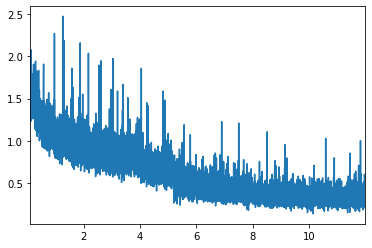

In [28]:
history['train_loss'].iloc[100:].plot();

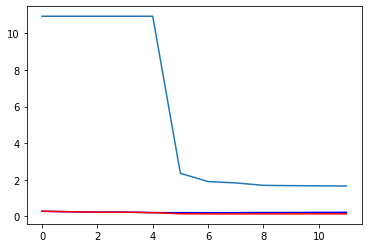

In [30]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss', color = 'blue');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss', color = 'red');
plt.show()

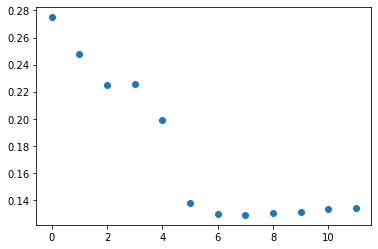

In [31]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [25]:
%%time
import gc

history = pd.DataFrame()

def criterion(prediction, mask, regr, weight=0.8, size_average=True):
    # Binary mask loss
    pred_mask = prediction[0]['hm']


    pred_mask = torch.sigmoid(pred_mask[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()

    # Regression L1 loss
    #pred_regr = prediction[:, 1:]
    pred_regr = prediction[0]['reg']
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)

    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    #if not size_average:
    #    loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss


for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)



train_loss (l=25.192)(m=25.19) (r=1.3265: 100%|██████████| 1055/1055 [06:41<00:00,  2.63it/s] 


Train Epoch: 0 	LR: 0.001000	Loss: 25.192076	MaskLoss: 25.192076	RegLoss: 1.326483


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 10.3180


train_loss (l=43.063)(m=43.06) (r=1.4699: 100%|██████████| 1055/1055 [06:44<00:00,  2.61it/s] 


Train Epoch: 1 	LR: 0.001000	Loss: 43.063160	MaskLoss: 43.063160	RegLoss: 1.469905


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 8.8557


train_loss (l=28.750)(m=28.75) (r=1.2911: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 2 	LR: 0.001000	Loss: 28.749805	MaskLoss: 28.749805	RegLoss: 1.291078


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 8.2376


train_loss (l=29.071)(m=29.07) (r=1.4353: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 3 	LR: 0.001000	Loss: 29.070995	MaskLoss: 29.070995	RegLoss: 1.435300


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 8.1866


train_loss (l=29.461)(m=29.46) (r=1.2204: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 4 	LR: 0.000100	Loss: 29.460821	MaskLoss: 29.460821	RegLoss: 1.220445


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 7.4703


train_loss (l=12.420)(m=24.40) (r=0.4390: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 5 	LR: 0.000100	Loss: 12.420088	MaskLoss: 24.401152	RegLoss: 0.439024


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 3.7504


train_loss (l=12.221)(m=24.14) (r=0.2980: 100%|██████████| 1055/1055 [06:43<00:00,  2.61it/s]


Train Epoch: 6 	LR: 0.000100	Loss: 12.220685	MaskLoss: 24.143368	RegLoss: 0.298003


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 3.8159


train_loss (l=17.270)(m=34.04) (r=0.4976: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 7 	LR: 0.000100	Loss: 17.270060	MaskLoss: 34.042564	RegLoss: 0.497555


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 3.9393


train_loss (l=11.687)(m=22.99) (r=0.3823: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 8 	LR: 0.000010	Loss: 11.686622	MaskLoss: 22.990982	RegLoss: 0.382262


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 4.1137


train_loss (l=7.375)(m=14.21) (r=0.5443: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s] 

Train Epoch: 9 	LR: 0.000010	Loss: 7.375438	MaskLoss: 14.206623	RegLoss: 0.544253



  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 4.1853


train_loss (l=10.877)(m=21.47) (r=0.2878: 100%|██████████| 1055/1055 [06:42<00:00,  2.62it/s]


Train Epoch: 10 	LR: 0.000010	Loss: 10.876685	MaskLoss: 21.465570	RegLoss: 0.287800


  0%|          | 0/1055 [00:00<?, ?it/s]

Dev loss: 4.2445


train_loss (l=7.981)(m=15.73) (r=0.2281: 100%|██████████| 1055/1055 [06:43<00:00,  2.62it/s] 


Train Epoch: 11 	LR: 0.000010	Loss: 7.981455	MaskLoss: 15.734853	RegLoss: 0.228058
Dev loss: 4.2971
CPU times: user 55min 58s, sys: 24min 29s, total: 1h 20min 28s
Wall time: 1h 21min 21s


In [26]:
torch.save(model.state_dict(), './model-dla34'+'_'+'w08'+'.pth')

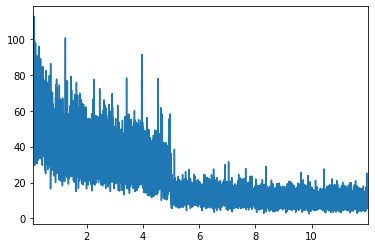

In [27]:
history['train_loss'].iloc[100:].plot();

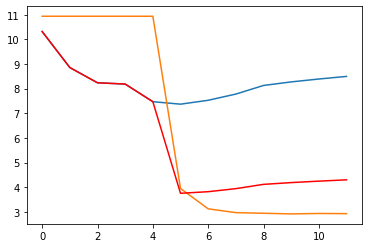

In [28]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss', color = 'red');
plt.show()

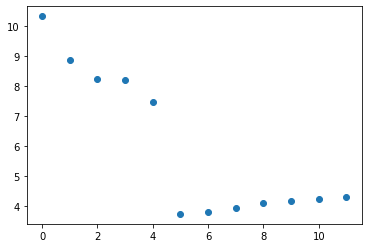

In [29]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [27]:
model.load_state_dict(torch.load( './model-dla34'+'_'+'w08'+'.pth'))
model.eval()

DLASeg(
  (base): DLA(
    (base_layer): Sequential(
      (0): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level0): Sequential(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level1): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level2): Tree(
      (tree1): BasicBlock(
        (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inpla

# Visualize predictions

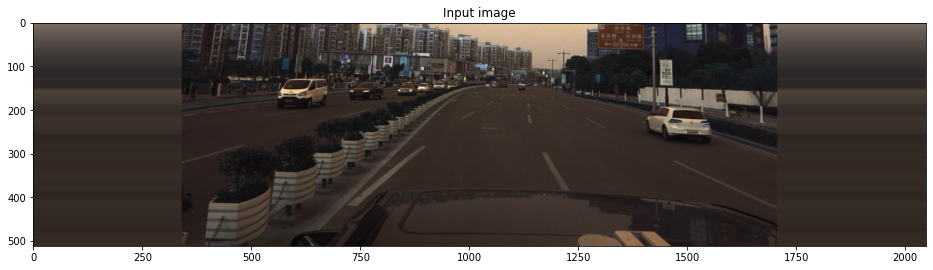

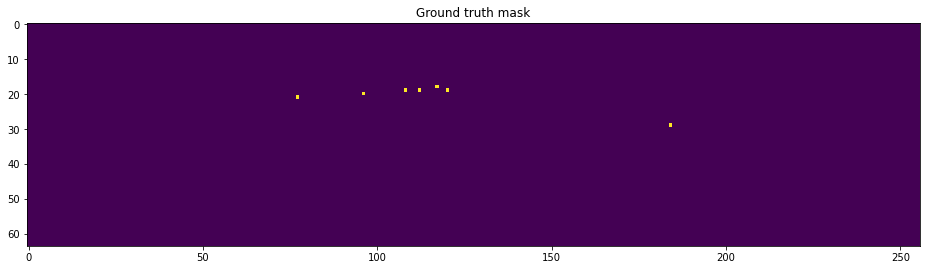

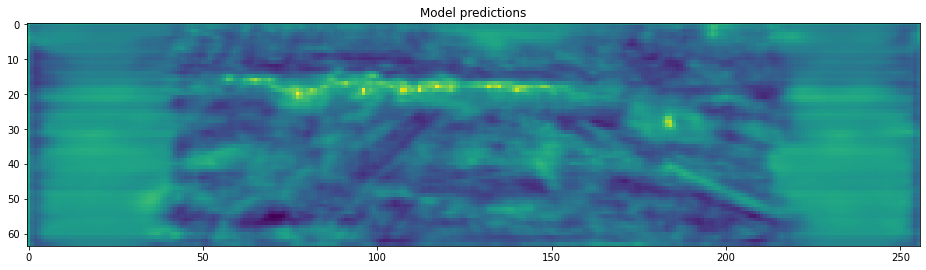

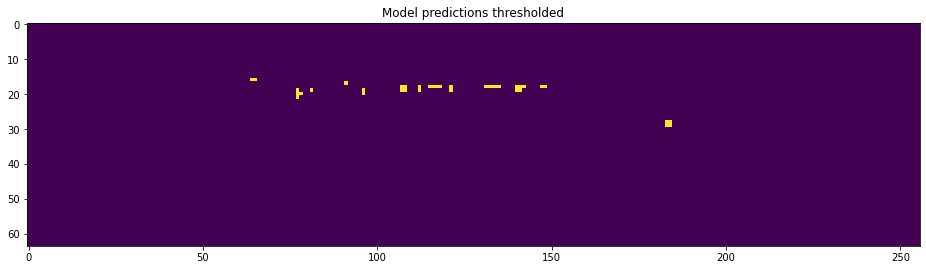

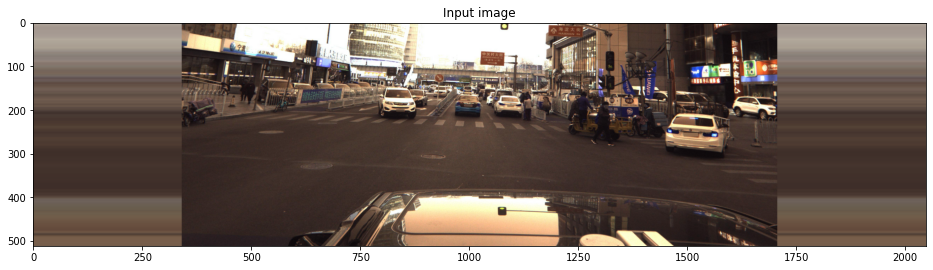

...

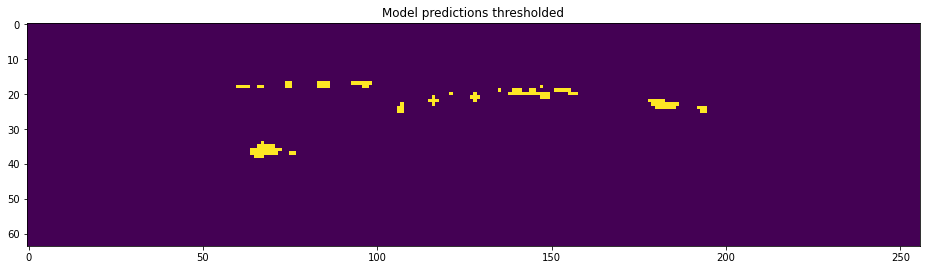

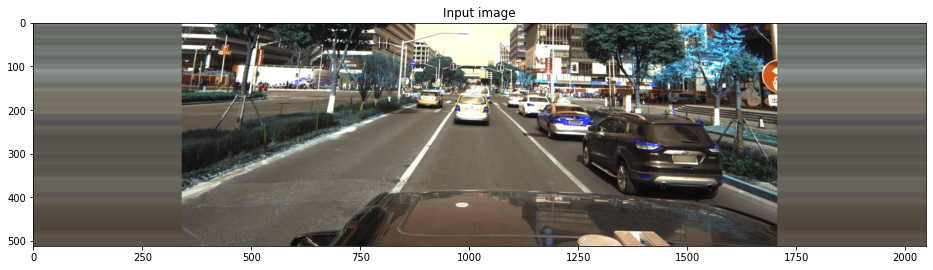

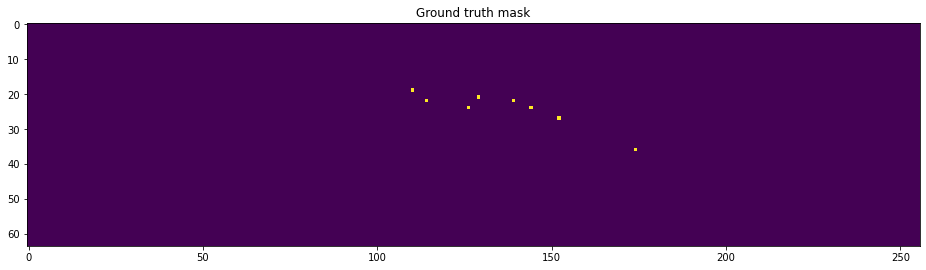

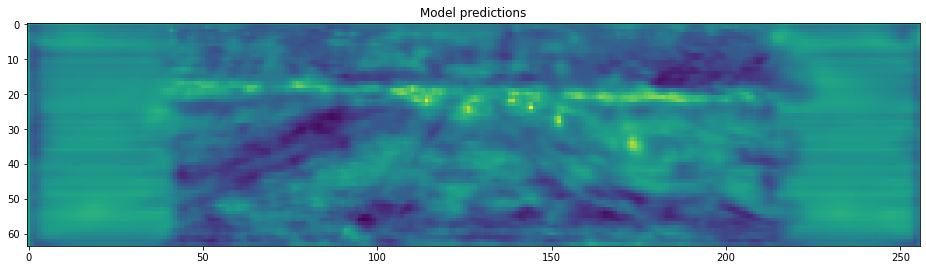

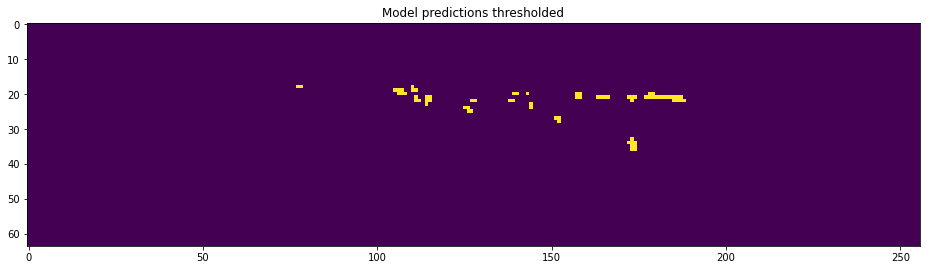

In [32]:
for i in range(10,20):
    img, mask, regr = dev_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()

    output = model(torch.tensor(img[None]).to(device))
    logits = output[0]['hm'].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits[0,0])
    plt.show()


    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits[0,0] > -2)
    plt.show()
    


In [33]:
# ## Simple test of probabilities
# act = torch.nn.Sigmoid()
# logtens = torch.from_numpy(logits)
# probs = act(logtens)
# probs = probs[probs>0.03]
# print(probs)

In [34]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

# Evaluation

In [35]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from inspect import signature
import matplotlib.pyplot as plt
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df



#def str2coords(s, names):
#    coords = []
#    for l in np.array(s.split()).reshape([-1, 7]):
#        coords.append(dict(zip(names, l.astype('float'))))
#    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

def print_pr_curve(result_flg, scores, recall_total=1):
    average_precision = average_precision_score(result_flg, scores)
    precision, recall, _ = precision_recall_curve(result_flg, scores)
    recall *= recall_total
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.show()

In [36]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


# validation prediction

In [37]:
threshold1 = -2
threshold2 = 1

In [38]:
# map: 0.10844716601852893 # -2
# map: 0.11908345067814112 # -3
# map: 0.1279842909587167  # -4
# map: 0.13395854895945764 # -5 
# map: 0.1383288800848642  # -6
# map: 0.14158187970998287 # -7

In [63]:
import copy

def peak(out, threshold1):
    out = out[0].cpu().numpy()
    
    (xlist, ylist) = np.where(out>np.sort(out.reshape((1,-1)))[0][-100])
    peak_array = copy.copy(out)

    
    maximum = out.max()
    for k in range(len(xlist)):
        idx = 0
        i = xlist[k]
        j = ylist[k]
        try:
            peak_array[i-1,j-1]
            peak_array[i+1,j+1]
        except:
            continue
        
        if int(out[i,j]>=out[i-1,j])+int(out[i,j]>=out[i+1,j])+\
                int(out[i,j]>=out[i,j-1])+int(out[i,j]>=out[i,j+1]) == 4:
            idx += 1
            
        if idx==1 and out[i,j]>threshold1-2:
            peak_array[i,j]+=(maximum - peak_array[i,j])*(1/2)
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
        
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<10 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
    return peak_array

In [87]:
def extract_coords(prediction, plot=False):
    
    #print(prediction[0][0].shape)
    #print(peak(prediction[0],threshold1).shape)
    
    img = prediction[0][0].cpu().numpy()
    #logits = prediction[0][0].cpu().numpy()
    #logits = peak(prediction[0], -2)
    logits = peak_tmp(prediction[0].cpu().numpy(), -2, 0.5)
    
    #peak(output[0],threshold1)
    
    if plot==True:    
        plt.figure(figsize=(15,8))
        plt.imshow(logits)
        plt.show()

        plt.figure(figsize=(15,8))
        plt.imshow(logits>threshold1)
        plt.show()
    
    regr_output = prediction[1].cpu().numpy()
    points = np.argwhere(logits > -2)

    # top 100 points
    (xlist, ylist) =  np.where(img>np.sort(img.reshape((1,-1)))[0][-100])
    top_list = [pair for pair in zip(list(xlist), list(ylist))]
    
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    
    for r, c in points:
        if (r,c) not in top_list:
            continue
            
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords





  0%|          | 0/11 [00:00<?, ?it/s]

(1, 64, 256)
penalty: -223.5
(1, 64, 256)
penalty: -259.0
(1, 64, 256)
penalty: -189.6
(1, 64, 256)
penalty: -524.5






  9%|▉         | 1/11 [00:04<00:47,  4.79s/it]

(1, 64, 256)
penalty: -224.6
(1, 64, 256)
penalty: -374.1
(1, 64, 256)
penalty: -279.3
(1, 64, 256)






 18%|█▊        | 2/11 [00:07<00:38,  4.31s/it]

penalty: -104.3
(1, 64, 256)
penalty: -615.1999999999999
(1, 64, 256)
penalty: -108.70000000000002
(1, 64, 256)
penalty: -54.2
(1, 64, 256)
penalty: -338.4






 27%|██▋       | 3/11 [00:11<00:31,  3.95s/it]

(1, 64, 256)
penalty: -32.6
(1, 64, 256)
penalty: -128.49999999999997
(1, 64, 256)
penalty: -32.699999999999996
(1, 64, 256)






 36%|███▋      | 4/11 [00:13<00:24,  3.49s/it]

penalty: -114.2
(1, 64, 256)
penalty: -100.0
(1, 64, 256)
penalty: -549.1999999999999
(1, 64, 256)
penalty: -298.2
(1, 64, 256)






 45%|████▌     | 5/11 [00:16<00:19,  3.33s/it]

penalty: -137.0
(1, 64, 256)
penalty: -101.19999999999999
(1, 64, 256)
penalty: -483.4
(1, 64, 256)
penalty: -46.2
(1, 64, 256)






 55%|█████▍    | 6/11 [00:19<00:16,  3.21s/it]

penalty: -150.79999999999998
(1, 64, 256)
penalty: -194.59999999999997
(1, 64, 256)
penalty: -66.60000000000001
(1, 64, 256)
penalty: -79.0
(1, 64, 256)






 64%|██████▎   | 7/11 [00:22<00:12,  3.03s/it]

penalty: -45.4
(1, 64, 256)
penalty: -36.6
(1, 64, 256)
penalty: -277.9
(1, 64, 256)
penalty: -176.0
(1, 64, 256)






 73%|███████▎  | 8/11 [00:24<00:08,  2.97s/it]

penalty: -172.09999999999997
(1, 64, 256)
penalty: -171.8
(1, 64, 256)
penalty: -383.79999999999995
(1, 64, 256)
penalty: -181.0
(1, 64, 256)
penalty: -112.89999999999999






 82%|████████▏ | 9/11 [00:27<00:05,  2.96s/it]

(1, 64, 256)
penalty: -122.9
(1, 64, 256)
penalty: -64.89999999999999
(1, 64, 256)
penalty: -151.0
(1, 64, 256)






 91%|█████████ | 10/11 [00:30<00:02,  2.83s/it]

penalty: -120.8
(1, 64, 256)
penalty: -183.8
(1, 64, 256)
penalty: -105.3
(1, 64, 256)
penalty: -231.0






100%|██████████| 11/11 [00:32<00:00,  2.96s/it]


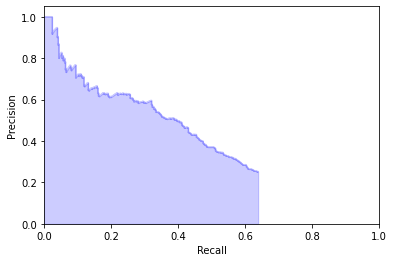

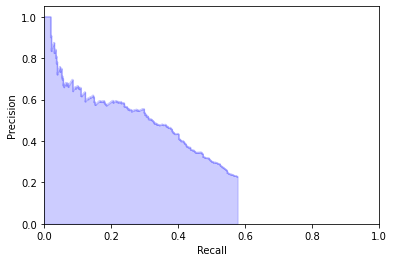

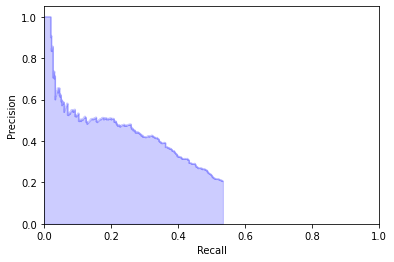

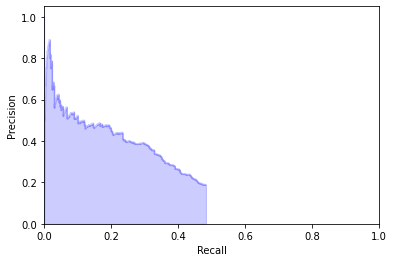

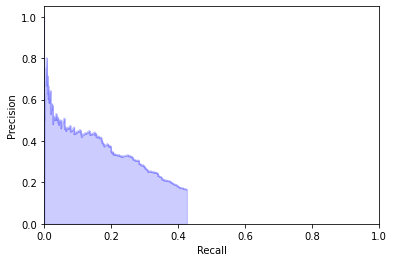

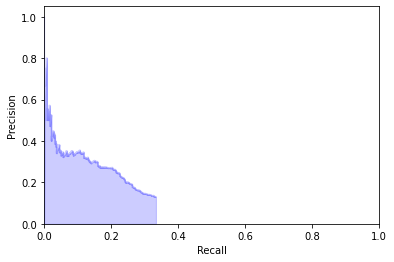

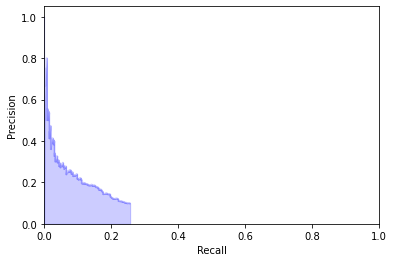

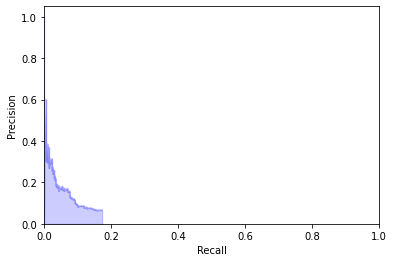

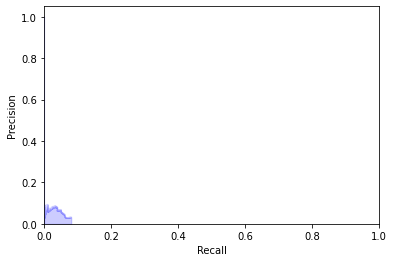

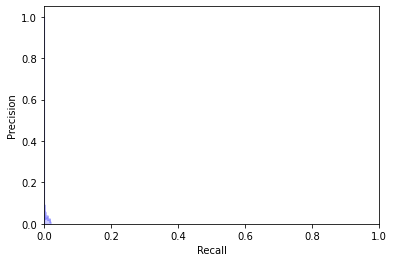

map: 0.14350006269408555


Process ForkPoolWorker-314:
Process ForkPoolWorker-309:
Process ForkPoolWorker-318:
Process ForkPoolWorker-315:
Process ForkPoolWorker-310:
Process ForkPoolWorker-316:
Process ForkPoolWorker-317:
Process ForkPoolWorker-312:
Process ForkPoolWorker-311:
Process ForkPoolWorker-313:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/home/dohee/anacon

In [88]:
import copy

predictions = []
dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
for img, _, _ in tqdm(dev_loader):
    with torch.no_grad():
        output = model(img.to(device))
    
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]))
        s = coords2str(coords)
        predictions.append(s)
        
df_dev['PredictionString'] = copy.copy(predictions)

valid_df = df_dev
expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
valid_df = valid_df.fillna('')

train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# data description page says, The pose information is formatted as
# model type, yaw, pitch, roll, x, y, z
# but it doesn't, and it should be
# model type, pitch, yaw, roll, x, y, z
expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

max_workers = 10
n_gt = len(expanded_train_df)
ap_list = []
p = Pool(processes=max_workers)
for result_flg, scores in p.imap(check_match, range(10)):
    if np.sum(result_flg) > 0:
        n_tp = np.sum(result_flg)
        recall = n_tp/n_gt
        ap = average_precision_score(result_flg, scores)*recall
        print_pr_curve(result_flg, scores, recall)
    else:
        ap = 0
    ap_list.append(ap)
map = np.mean(ap_list)
print('map:', map)

In [94]:
def peak_tmp(array, threshold1, threshold2):
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-100])
    
    peak_array = array[0]
    maximum = array.max()
    
#     advantage = 0
#     for k in range(len(xlist)):
#         i = xlist[k]
#         j = ylist[k]
#         ct1 = 0 # 주변의 점들이 top 50 안에 있는가
#         ct2 = 0 # 주변의 점들의 값이 더 작은가 
        
#         if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
#             surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
#             for xy in surroundings:
#                 if xy[0] in xlist and xy[1] in ylist:
#                     ct1 += 1
#                 if peak_array[i,j] > peak_array[xy[0], xy[1]]:
#                     ct2 += 1
#             if ct1 > 6 and ct2 > 7:
#                 advantage += 1
#                 peak_array[i,j] += min((maximum - peak_array[i,j])*(1/2),2)
            
    penalty = np.zeros(array[0].shape)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0
            ct_vert = 0
            ct_hori = 0
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            horizontal = [(i,j-1),(i,j),(i,j+1)]
            vertical = [(i-1,j),(i,j),(i+1,j)] 
            
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1
                    
            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_vert += 1

            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_hori += 1

            if ct_sur > 2:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 1:
                    penalty[i,j]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 2:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 3:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1

            elif ct_sur > 1:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 1:
                    penalty[i,j]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 2:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 3:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3

            if ct_vert == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 1:
                    penalty[i-1,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 2:
                    penalty[i-1,j]-=0.5
                    penalty[i,j]-=0.5
                    
            if ct_hori == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 1:
                    penalty[i,j-1]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 2:
                    penalty[i,j-1]-=0.5
                    penalty[i,j]-=0.5
                    
                
    #print("advantage:", advantage)
    print("penalty:", np.sum(penalty))            
    peak_array = peak_array + penalty*threshold2
    
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<5 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array #, advantage



    
#     plt.figure(figsize=(16,16))
#     plt.title('New')
#     plt.imshow(peak(logits[None],threshold1,threshold2)[0]>-2)
#     plt.show()

In [69]:
threshold1 = -2

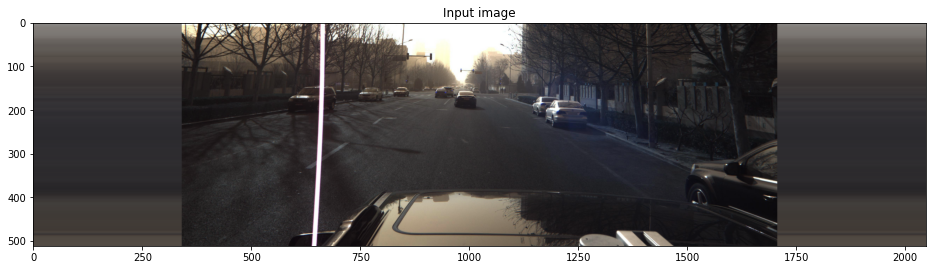

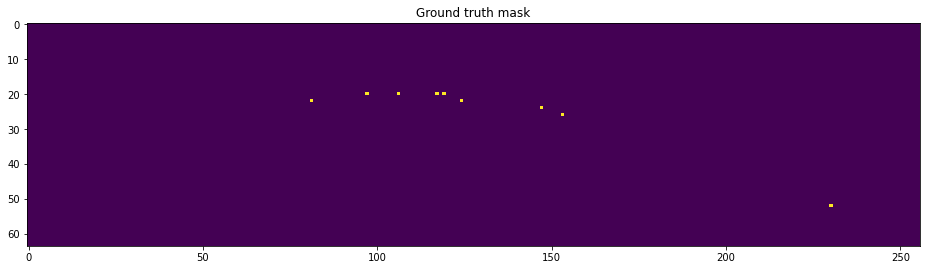

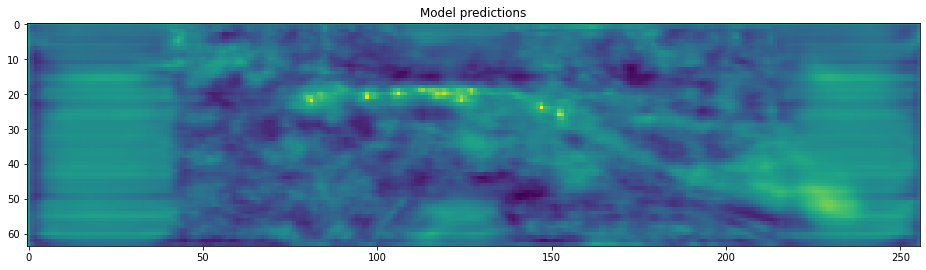

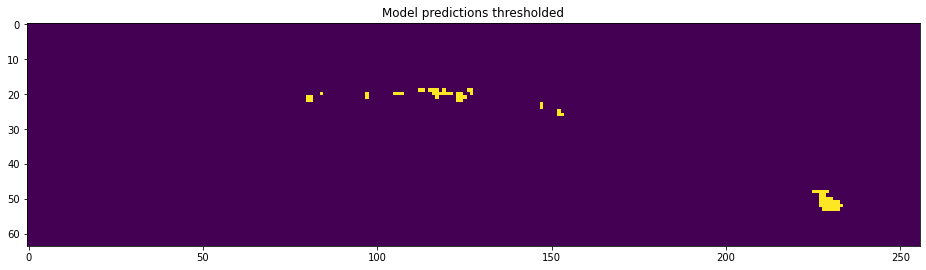

(1, 64, 256)
penalty: -174.8


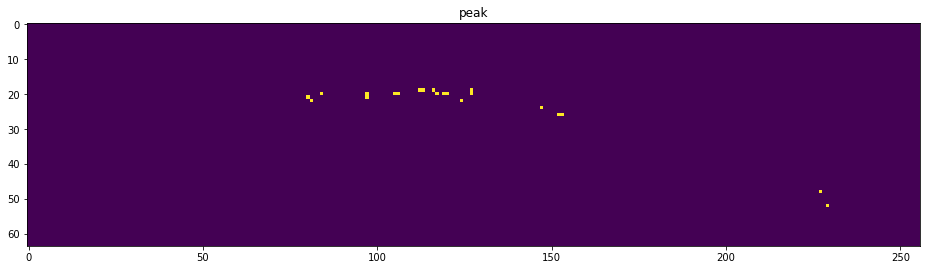

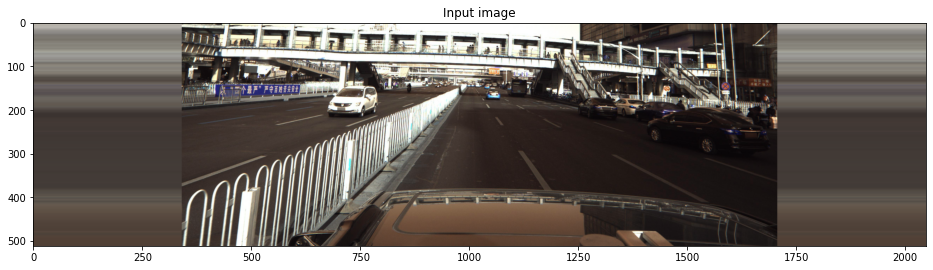

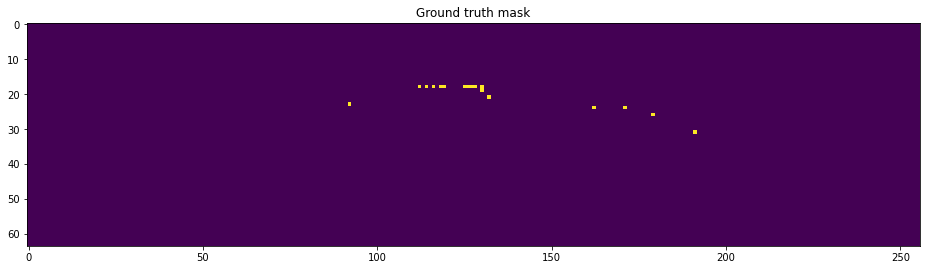

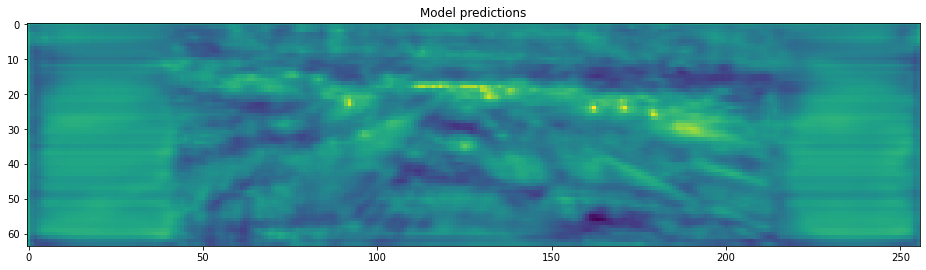

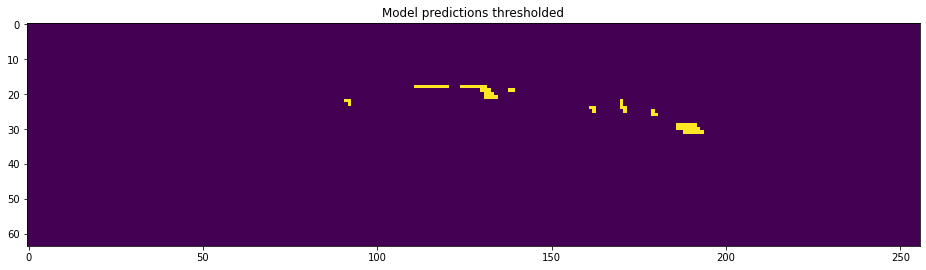

(1, 64, 256)
penalty: -146.2


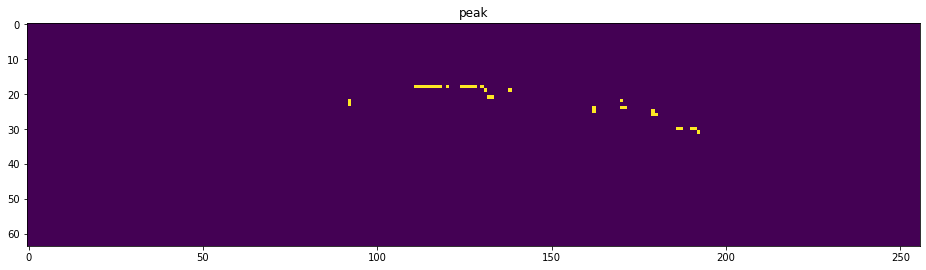

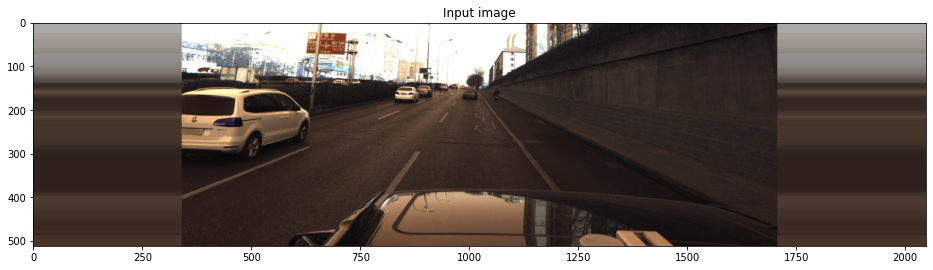

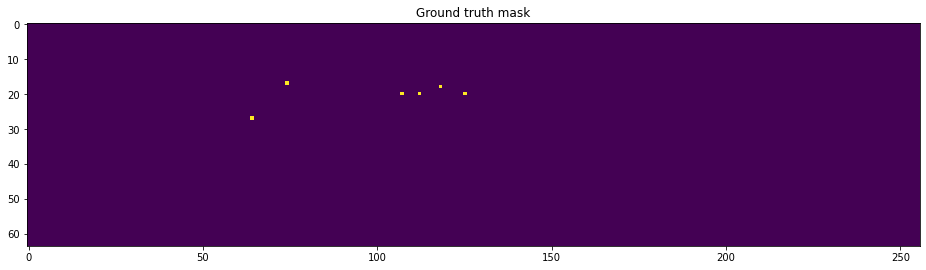

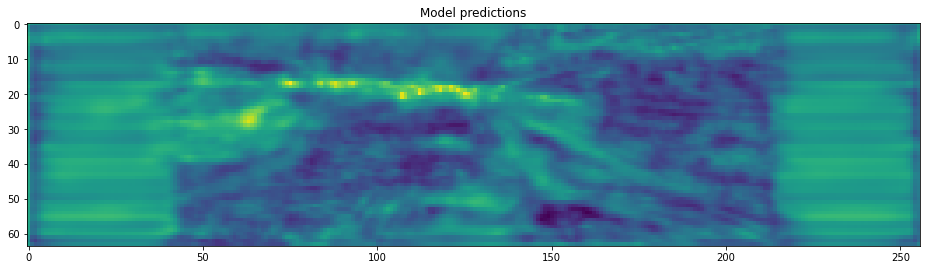

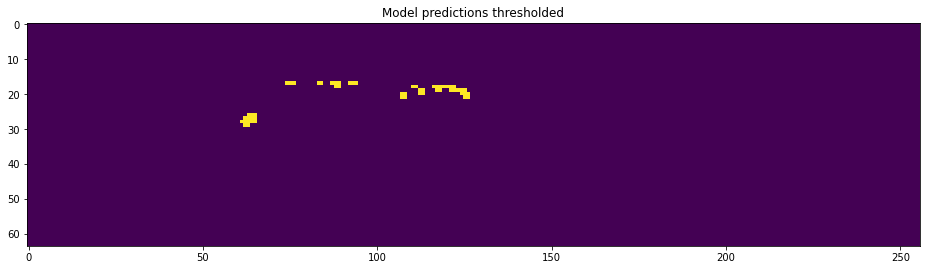

(1, 64, 256)
penalty: -127.49999999999999


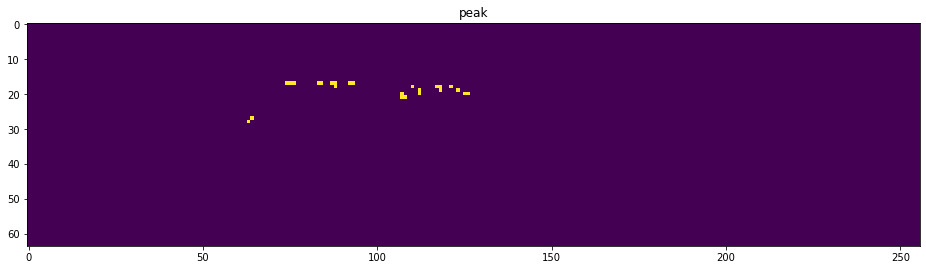

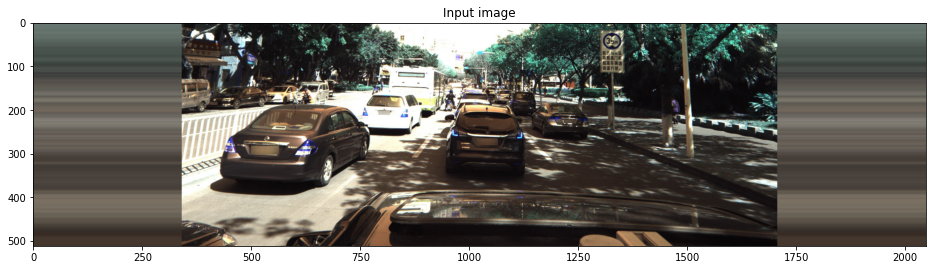

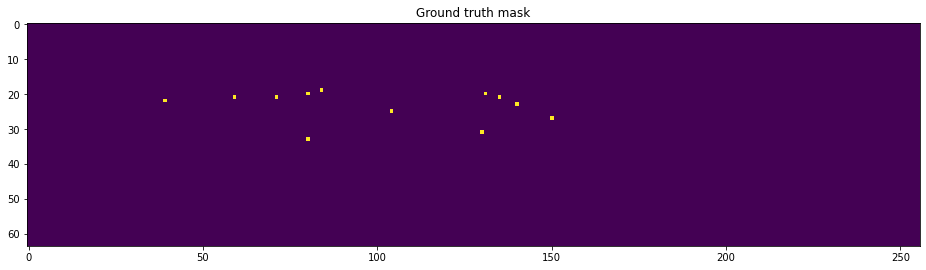

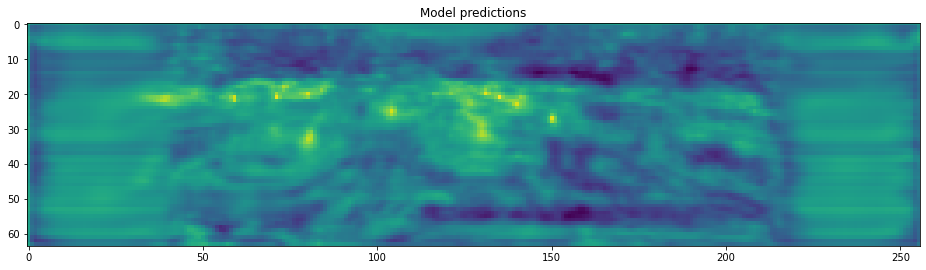

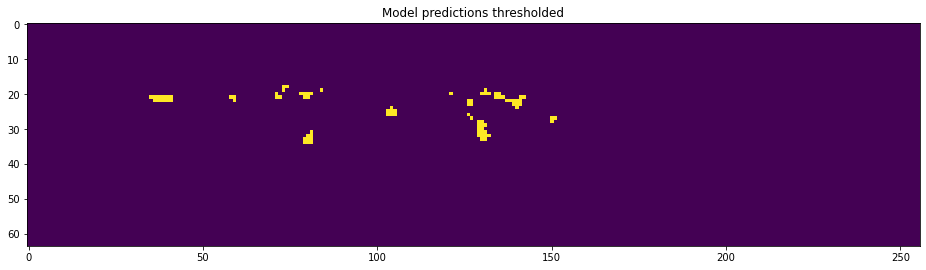

(1, 64, 256)
penalty: -218.2


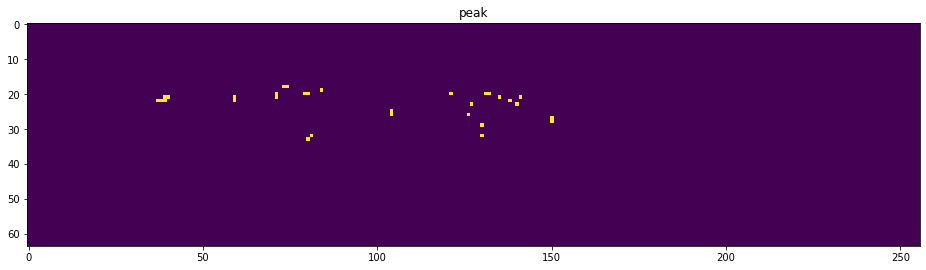

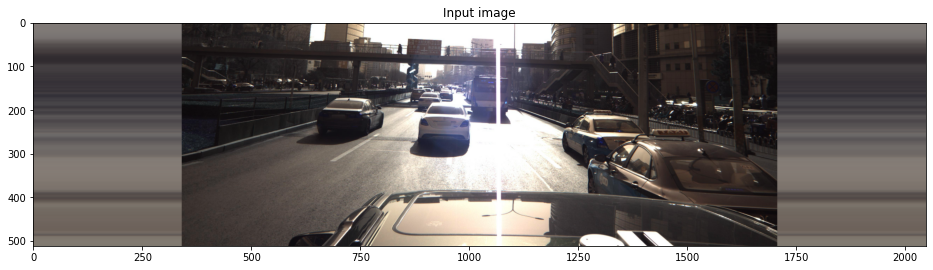

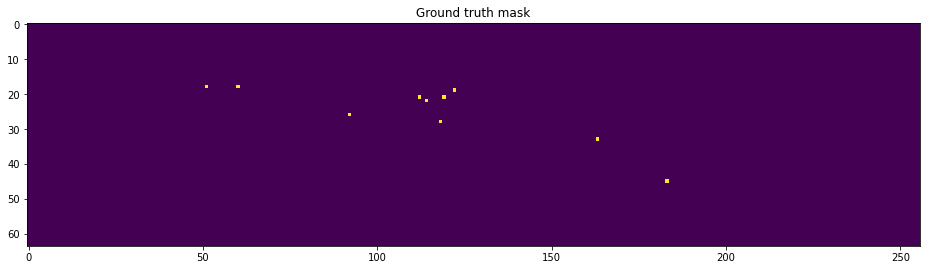

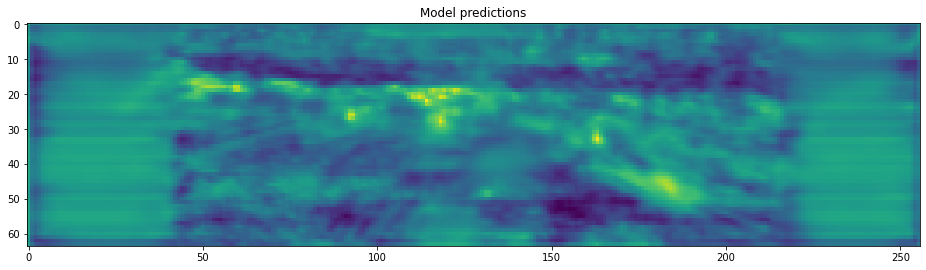

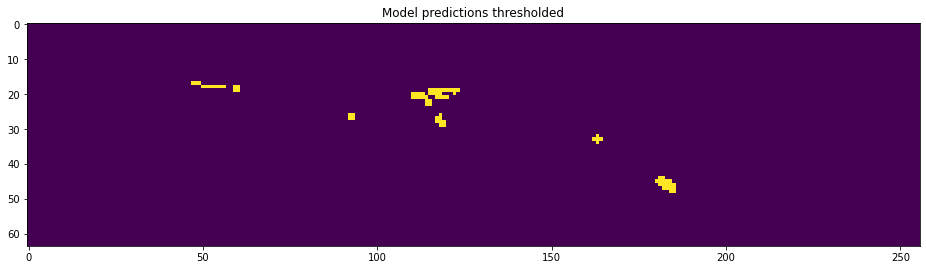

(1, 64, 256)
penalty: -204.8


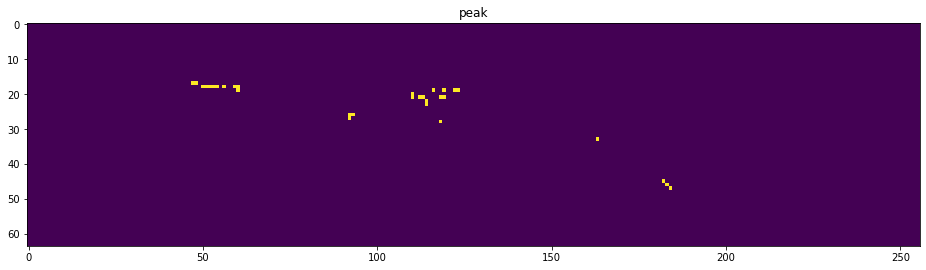

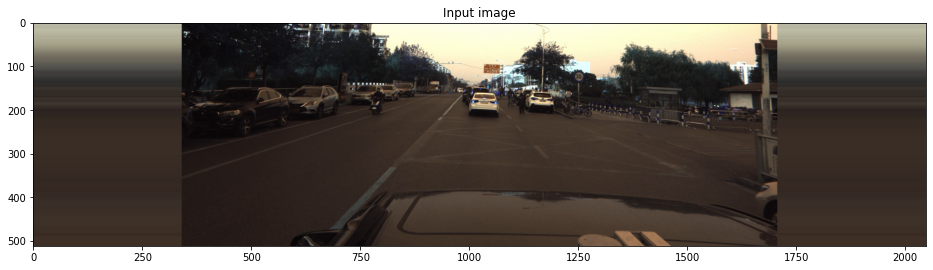

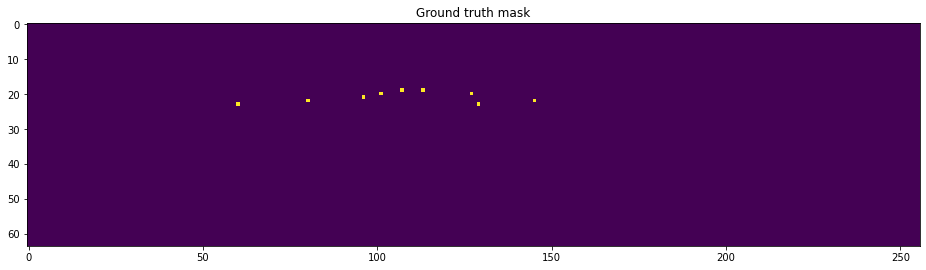

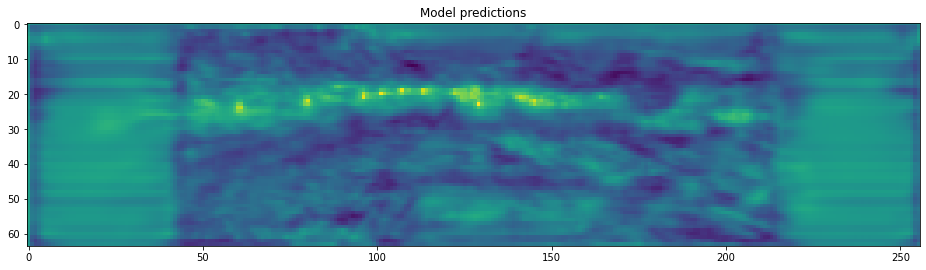

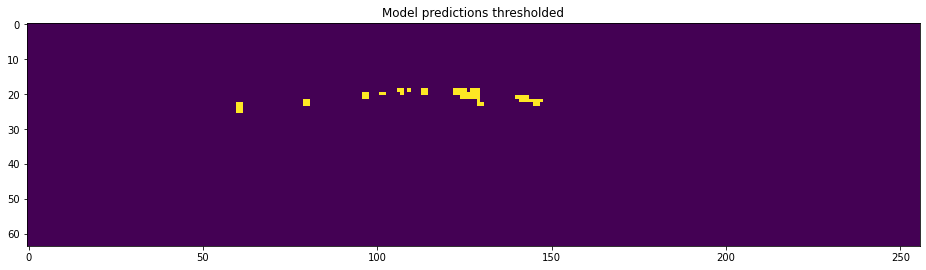

(1, 64, 256)
penalty: -145.2


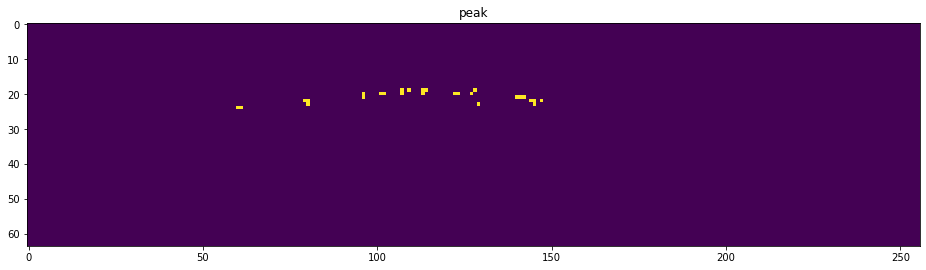

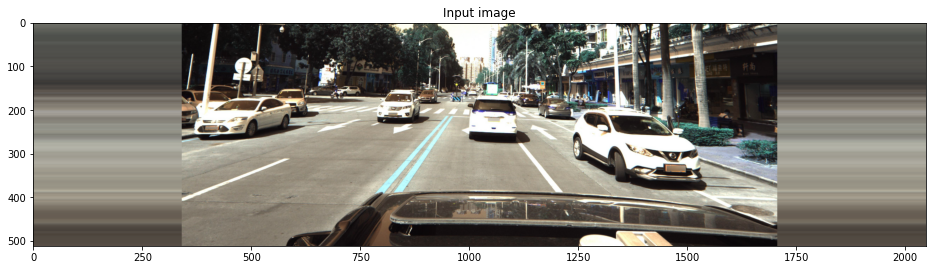

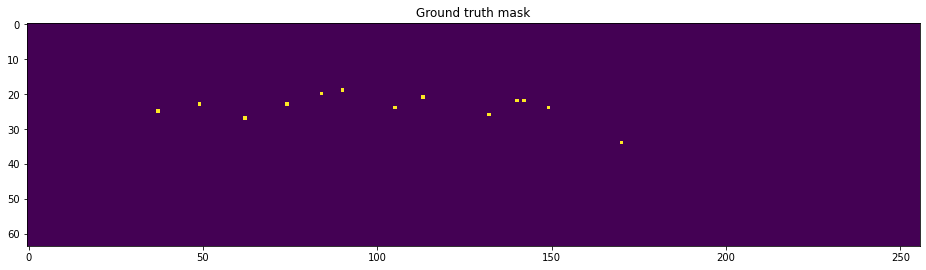

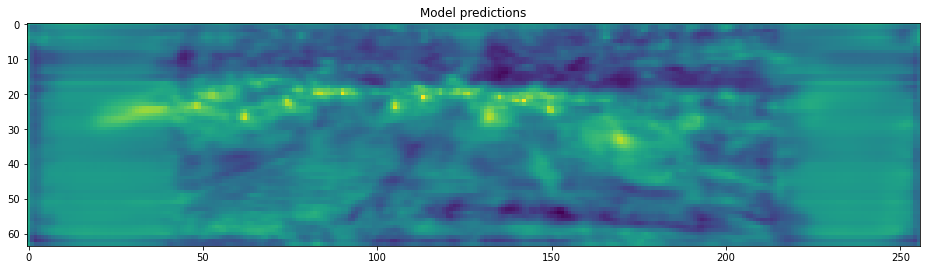

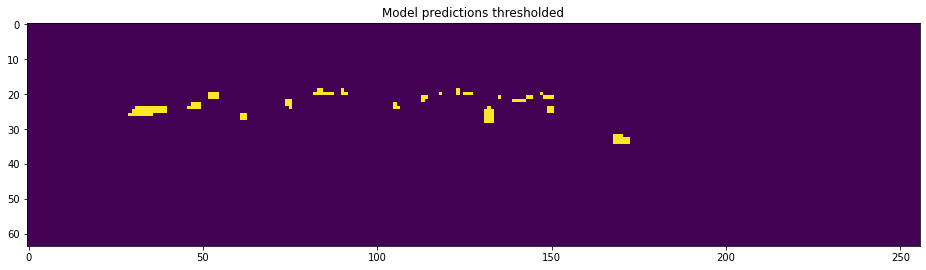

(1, 64, 256)
penalty: -254.59999999999997


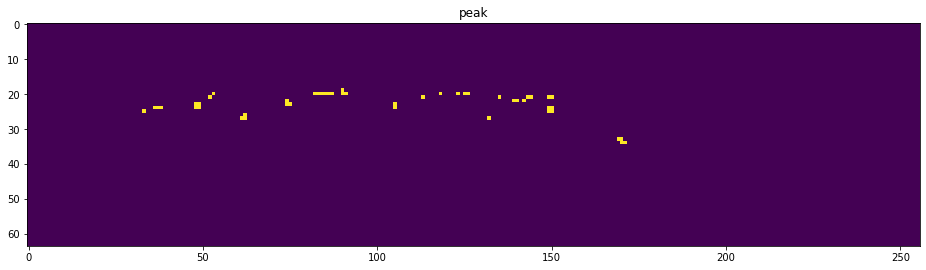

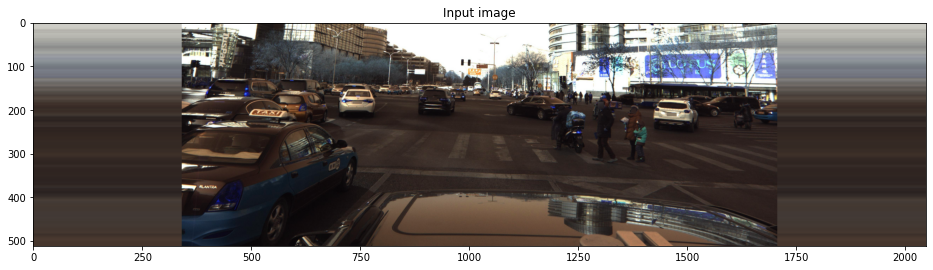

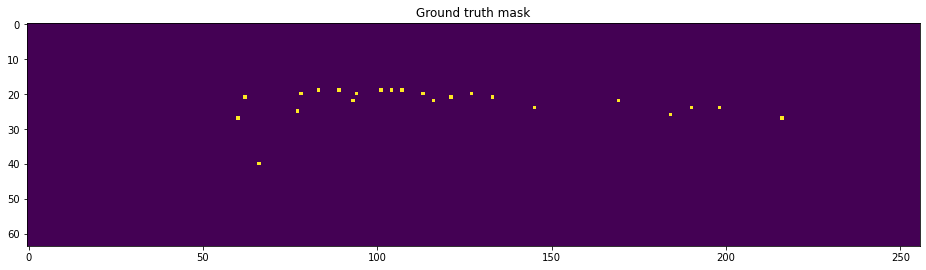

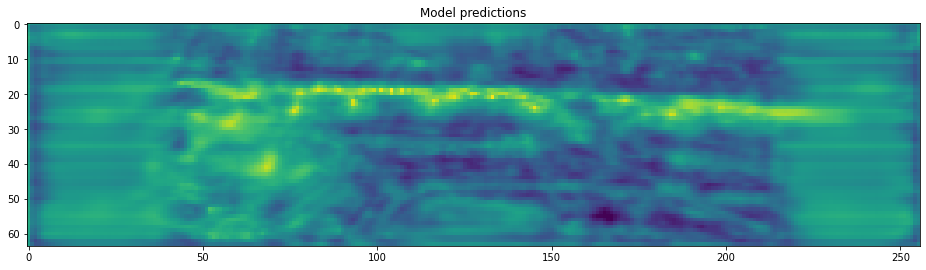

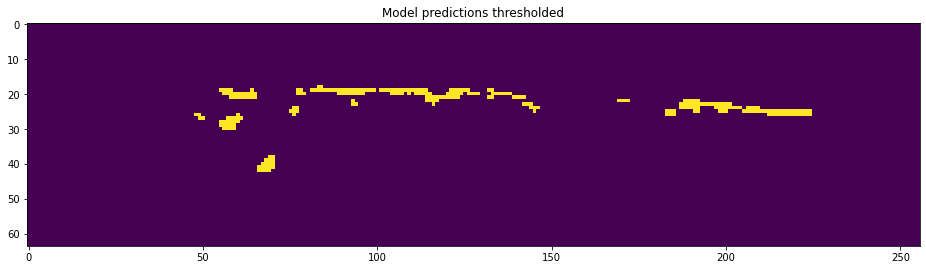

(1, 64, 256)
penalty: -711.8


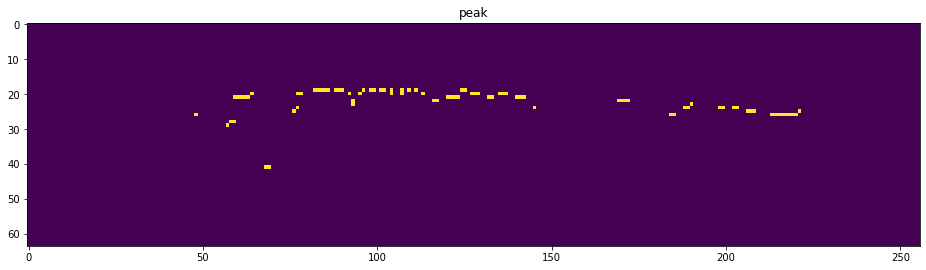

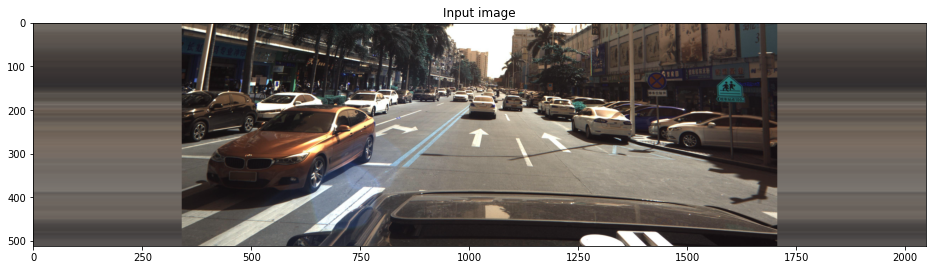

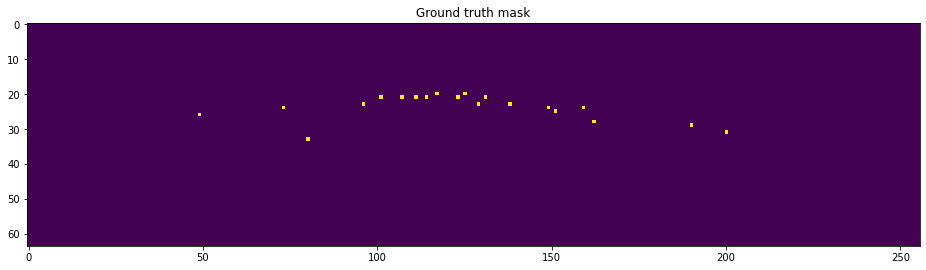

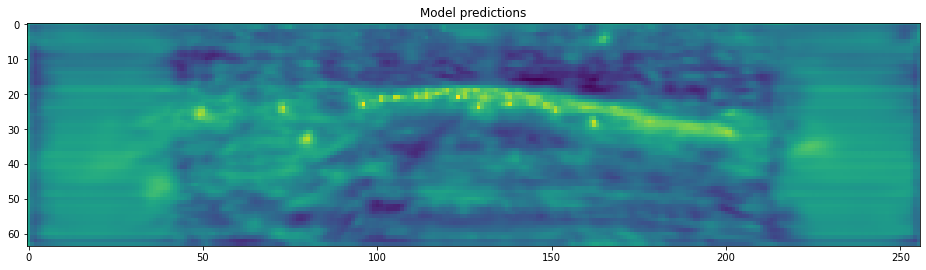

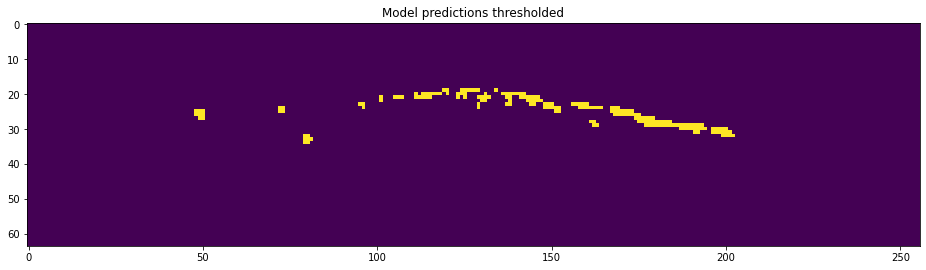

(1, 64, 256)
penalty: -473.50000000000006


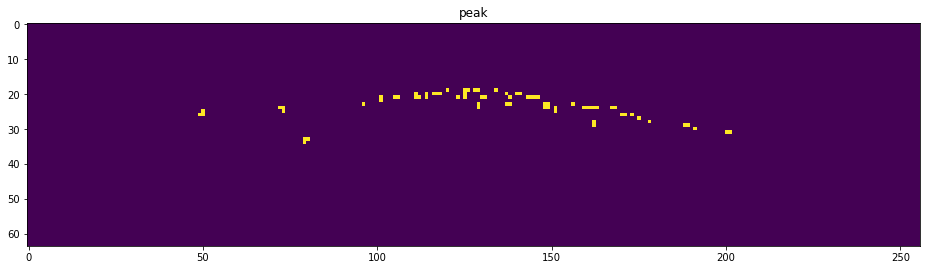

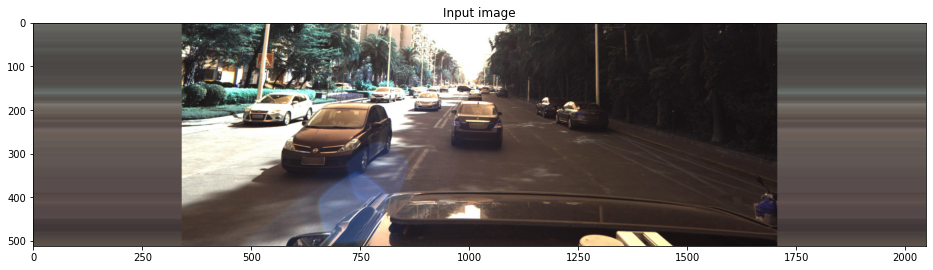

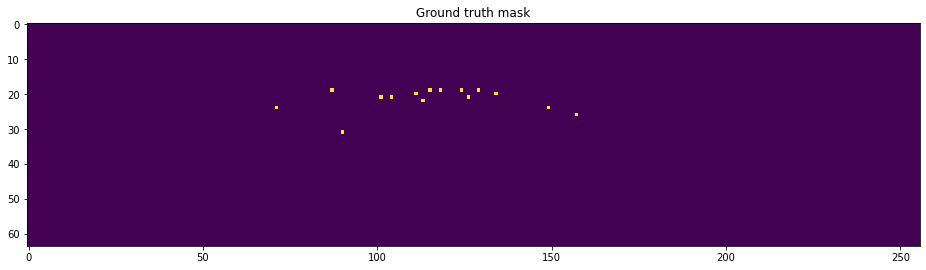

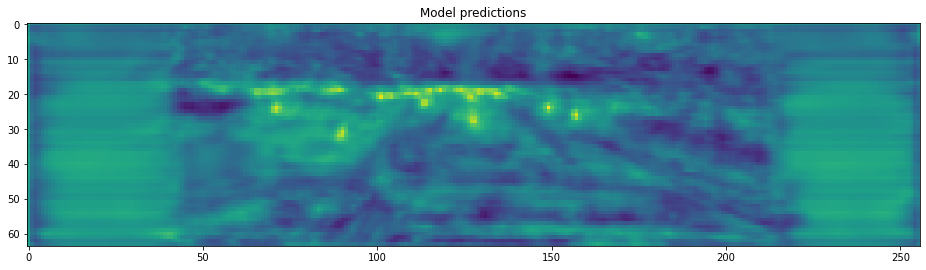

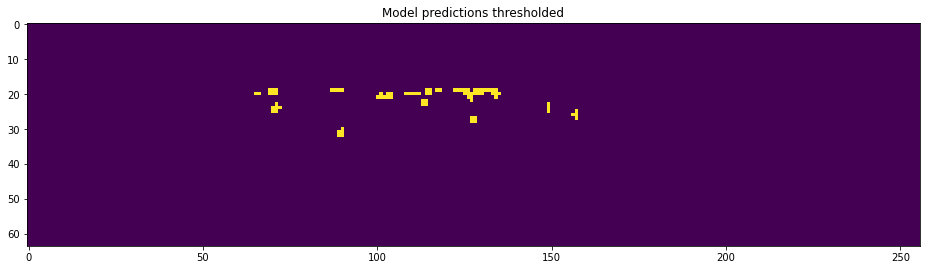

(1, 64, 256)
penalty: -176.0


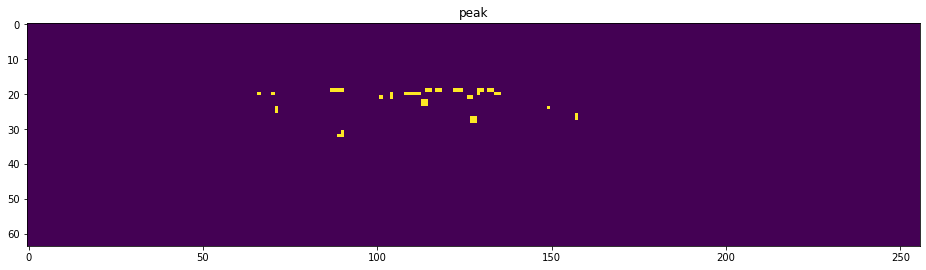

In [82]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]
    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    
    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()
    
    img = peak_tmp(output[0].detach().cpu().numpy(),threshold1,0.5)
    plt.figure(figsize=(16,16))
    plt.title('peak')
    plt.imshow(img>-2)
    plt.show()
    
#     img = peak(output[0].detach(),threshold1)
#     plt.figure(figsize=(16,16))
#     plt.title('peak')
#     plt.imshow(img>-2)
#     plt.show()


# Make submission

In [92]:
def show_coords(prediction, threshold1):
    #logits = peak(prediction[0], threshold1) 
    #logits = prediction[0][0].cpu().numpy()
    logits = peak_tmp(output[0].detach().cpu().numpy(),threshold1,0.5)
    plt.figure(figsize=(12, 8))
    plt.imshow(logits)
    plt.show()

    regr_output = prediction[1:]
    plt.figure(figsize=(12, 8))
    plt.imshow(logits > threshold1)
    plt.show()

# Show prediction results






  0%|          | 0/506 [00:00<?, ?it/s]

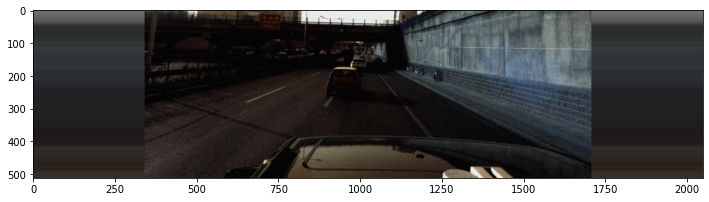

(1, 64, 256)
penalty: -30.799999999999997


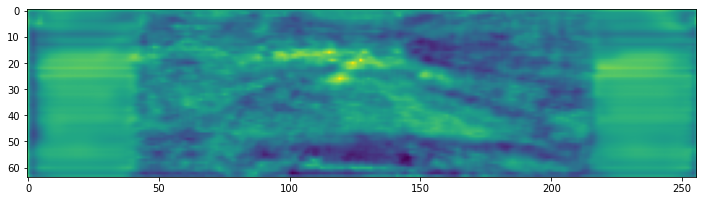

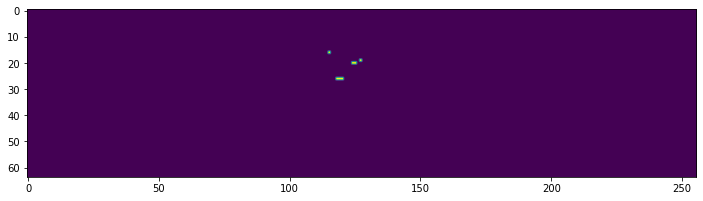






  0%|          | 1/506 [00:02<24:57,  2.96s/it]

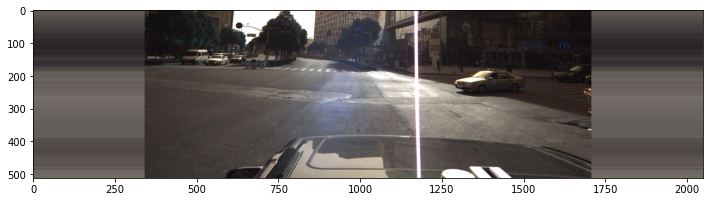

(1, 64, 256)
penalty: -106.6


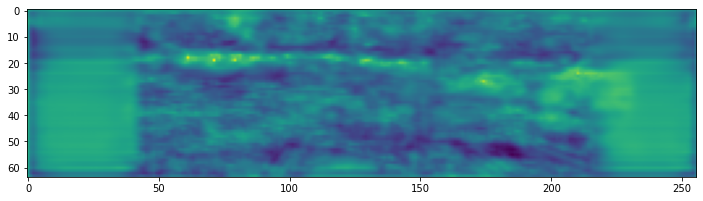

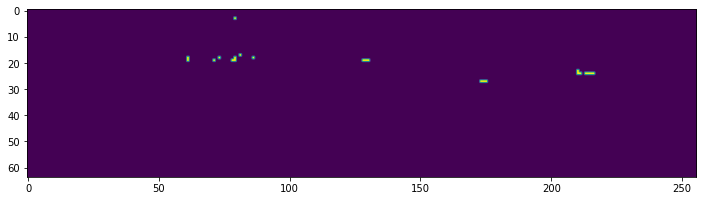






  0%|          | 2/506 [00:04<21:17,  2.54s/it]

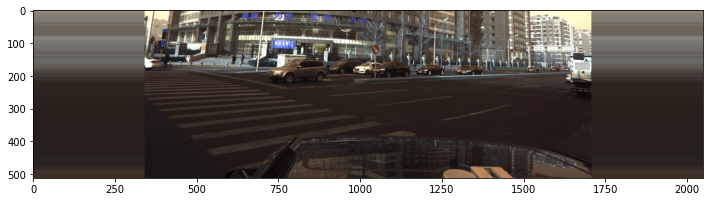

(1, 64, 256)
penalty: -100.7


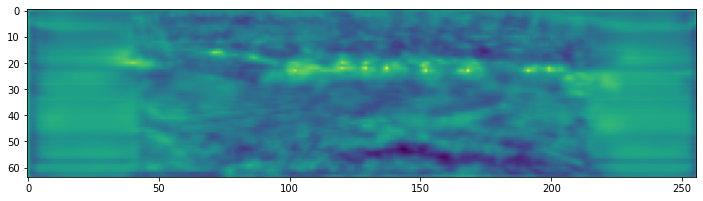

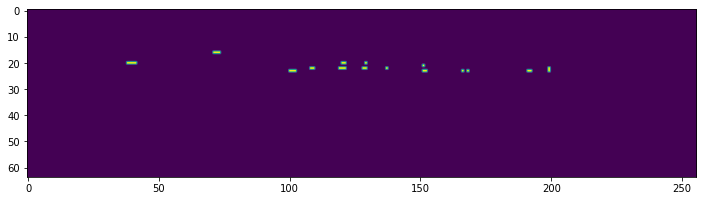






  1%|          | 3/506 [00:05<18:11,  2.17s/it]

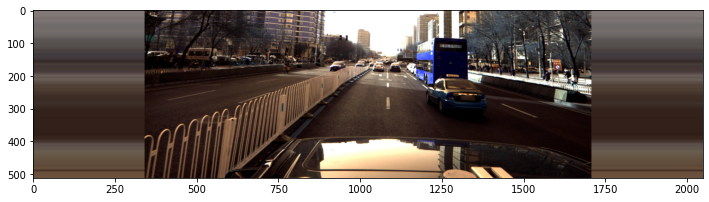

(1, 64, 256)
penalty: -349.79999999999995


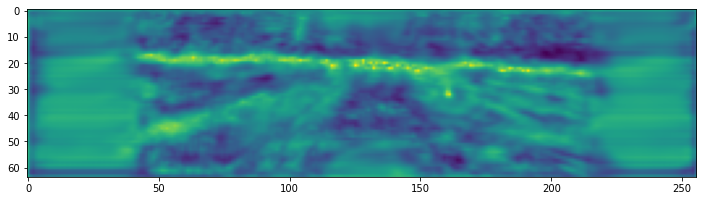

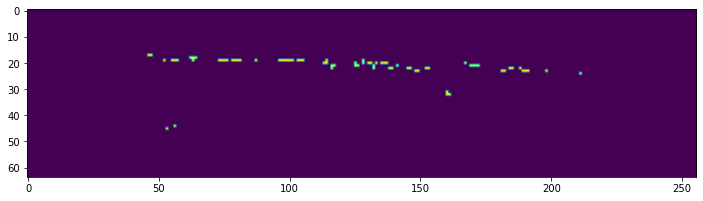






  1%|          | 4/506 [00:07<16:10,  1.93s/it]

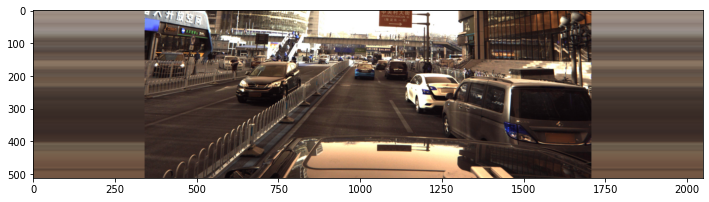

(1, 64, 256)
penalty: -259.9


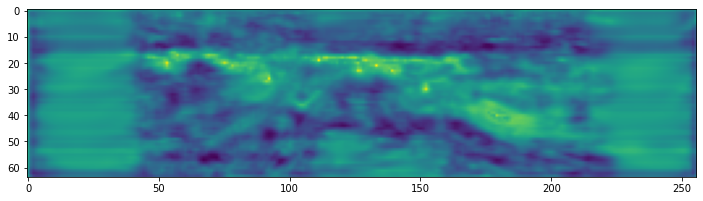

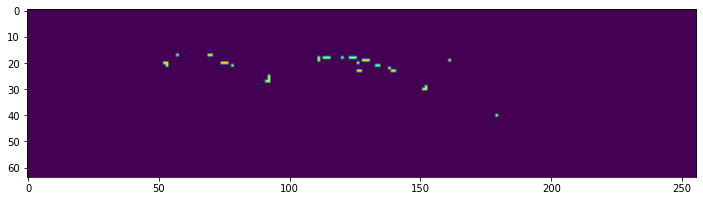






  1%|          | 5/506 [00:08<14:56,  1.79s/it]

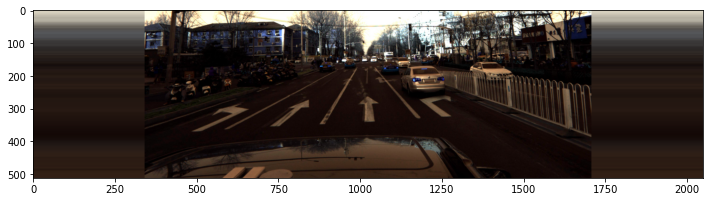

(1, 64, 256)
penalty: -147.89999999999998


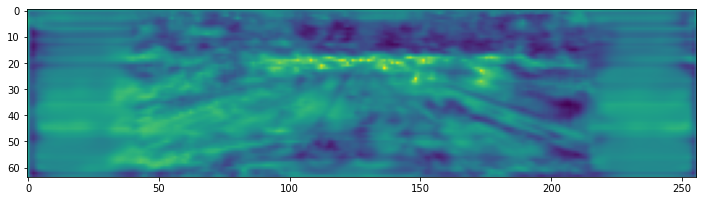

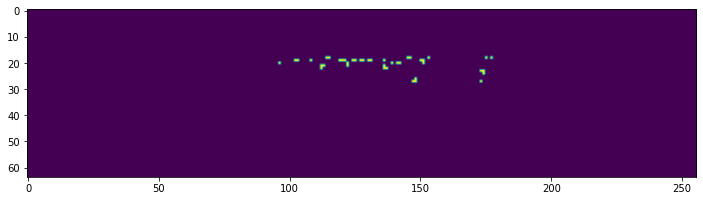






  1%|          | 6/506 [00:10<14:00,  1.68s/it]

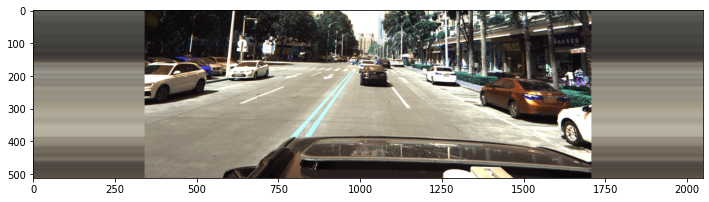

(1, 64, 256)
penalty: -323.70000000000005


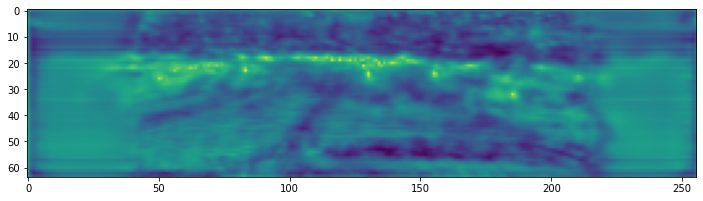

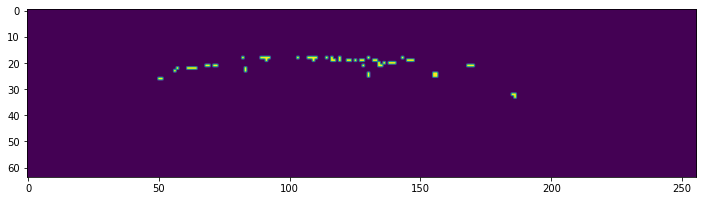






  1%|▏         | 7/506 [00:11<13:16,  1.60s/it]

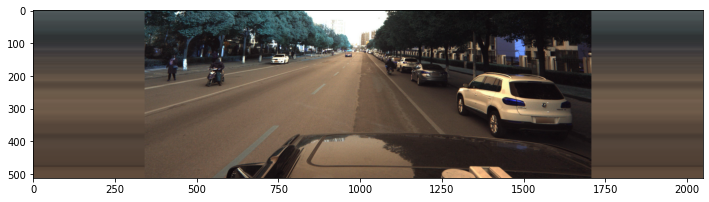

(1, 64, 256)
penalty: -94.5


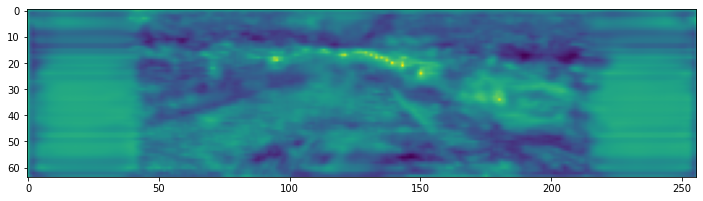

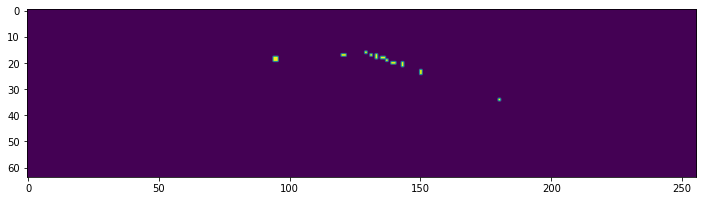






  2%|▏         | 8/506 [00:12<12:35,  1.52s/it]

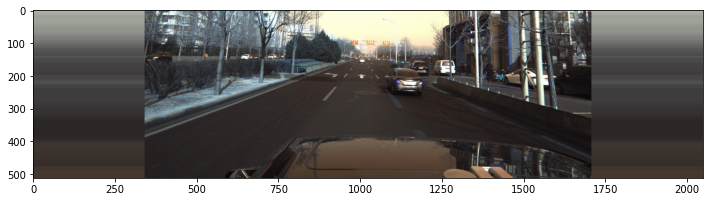

(1, 64, 256)
penalty: -143.0


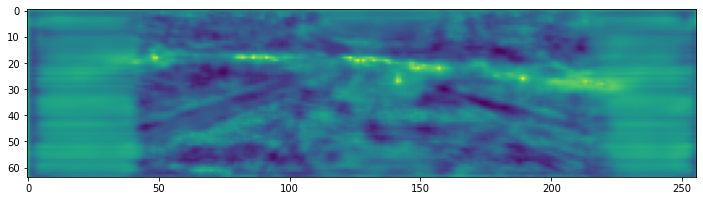

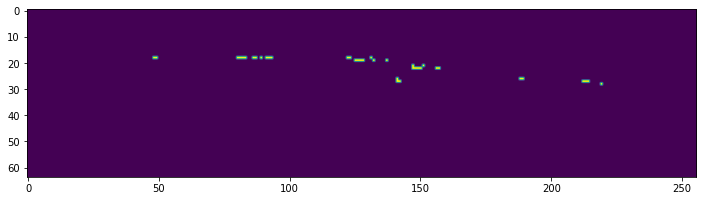






  2%|▏         | 9/506 [00:14<12:32,  1.51s/it]

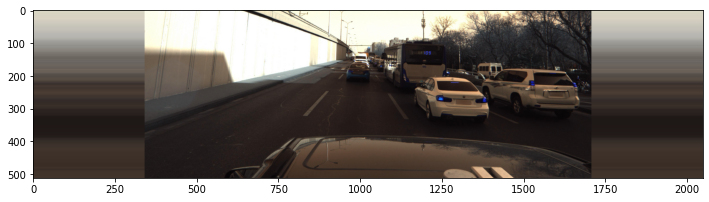

(1, 64, 256)
penalty: -131.6


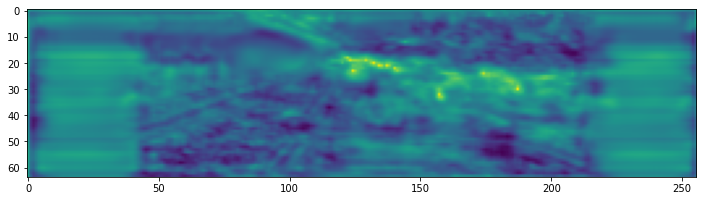

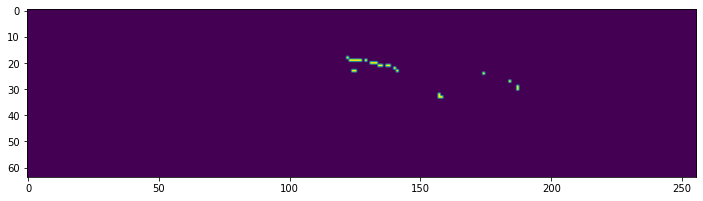






  2%|▏         | 10/506 [00:15<12:06,  1.47s/it]

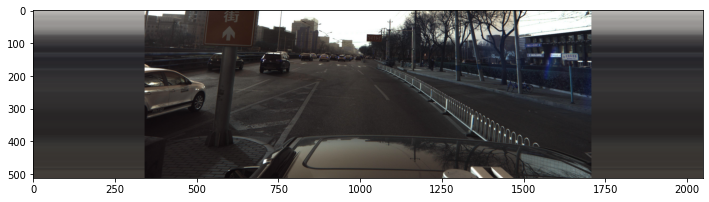

(1, 64, 256)
penalty: -280.0


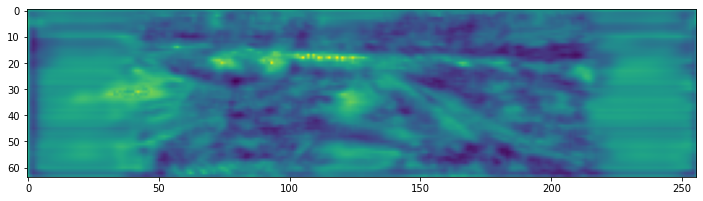

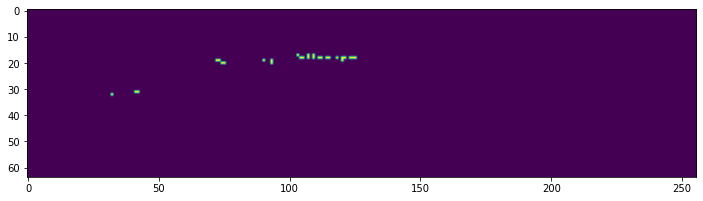






  2%|▏         | 11/506 [00:17<11:57,  1.45s/it]

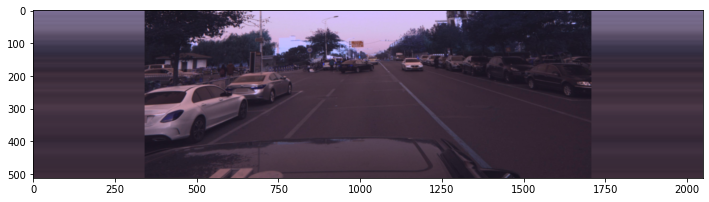

(1, 64, 256)
penalty: -250.39999999999998


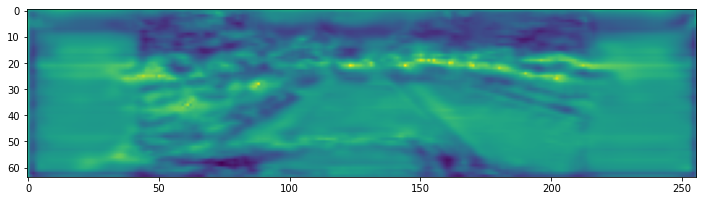

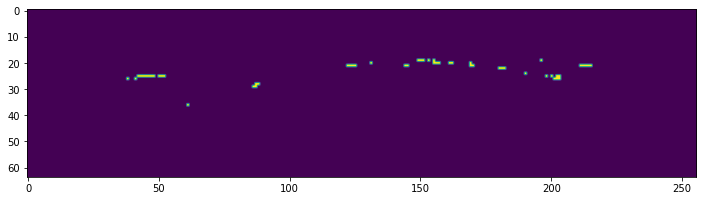






  2%|▏         | 12/506 [00:18<11:34,  1.41s/it]

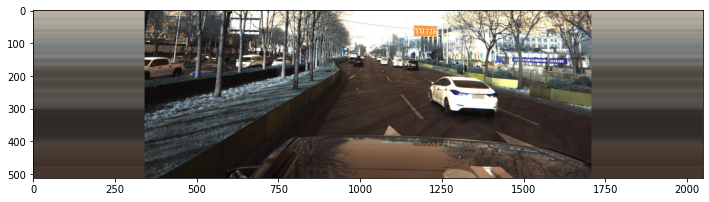

(1, 64, 256)
penalty: -204.2


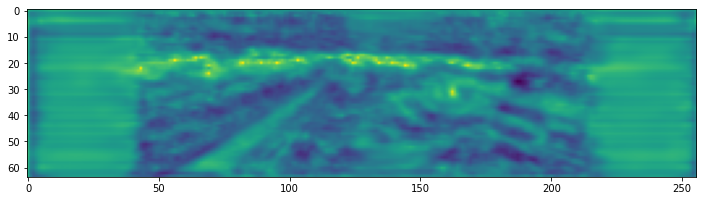

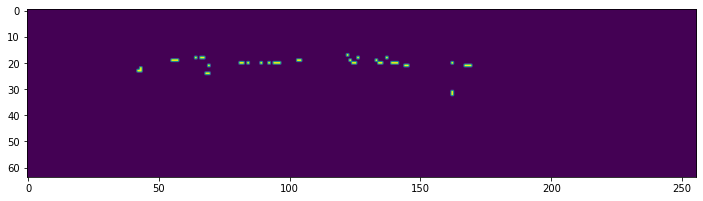






  3%|▎         | 13/506 [00:19<11:17,  1.37s/it]

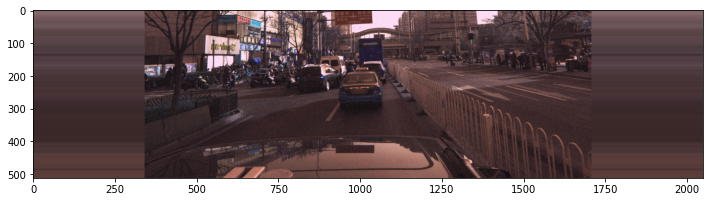

(1, 64, 256)
penalty: -66.8


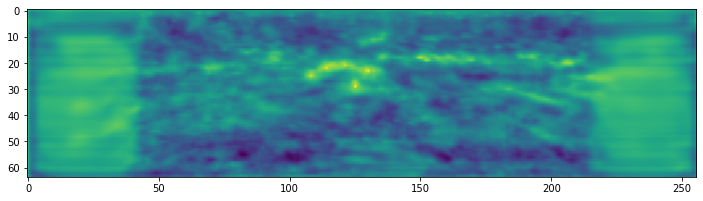

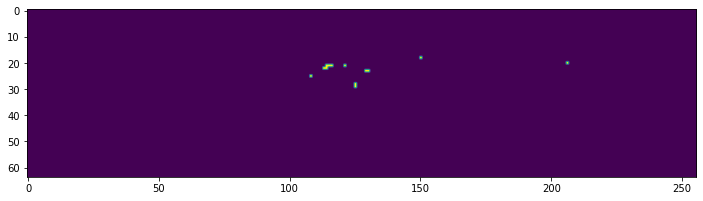






  3%|▎         | 14/506 [00:21<11:16,  1.38s/it]Process Process-338:
Process Process-341:
Process Process-339:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/pytho

In [93]:
threshold1 = -2
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()

for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output,threshold1)
        

# Submission

In [95]:
predictions = []
test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
plot = False
for img, _, _ in tqdm(test_loader):
    idx = 0
    with torch.no_grad():
        output = model(img.to(device))
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]))
        s = coords2str(coords)
        predictions.append(s)
        
        if plot == True:
            plt.figure(figsize=(15, 8))
            plt.imshow(np.einsum('ijk->jki', img[idx]))
            plt.show()

        idx += 1
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions_DLA-G-F_peak_tmp_w08'+'_'+str(threshold1)+'.csv', index=False)
test.head()







  0%|          | 0/506 [00:00<?, ?it/s]

penalty: -30.799999999999997
penalty: -198.79999999999998
penalty: -265.7
penalty: -238.20000000000002








  0%|          | 1/506 [00:04<36:13,  4.30s/it]

penalty: -106.6
penalty: -59.199999999999996
penalty: -178.2








  0%|          | 2/506 [00:06<31:59,  3.81s/it]

penalty: -122.6
penalty: -100.7
penalty: -165.3
penalty: -173.0








  1%|          | 3/506 [00:09<29:26,  3.51s/it]

penalty: -95.5
penalty: -349.79999999999995
penalty: -69.9
penalty: -35.9








  1%|          | 4/506 [00:12<27:34,  3.30s/it]

penalty: -75.8
penalty: -259.9
penalty: -651.1
penalty: -136.39999999999998
penalty: -193.6








  1%|          | 5/506 [00:15<27:16,  3.27s/it]

penalty: -147.89999999999998
penalty: -119.9
penalty: -457.29999999999995
penalty: -349.9








  1%|          | 6/506 [00:18<27:07,  3.25s/it]

penalty: -323.70000000000005
penalty: -164.70000000000002
penalty: -185.4








  1%|▏         | 7/506 [00:22<27:19,  3.28s/it]

penalty: -234.19999999999993
penalty: -94.5
penalty: -324.3
penalty: -467.7








  2%|▏         | 8/506 [00:25<27:30,  3.31s/it]

penalty: -169.4
penalty: -143.0
penalty: -122.2
penalty: -127.99999999999997








  2%|▏         | 9/506 [00:28<26:25,  3.19s/it]

penalty: -85.89999999999999
penalty: -131.6
penalty: -88.0
penalty: -262.8








  2%|▏         | 10/506 [00:31<24:58,  3.02s/it]

penalty: -65.8
penalty: -280.0
penalty: -26.399999999999995
penalty: -207.79999999999998
penalty: -309.09999999999997








  2%|▏         | 11/506 [00:34<24:46,  3.00s/it]

penalty: -250.39999999999998
penalty: -181.19999999999996
penalty: -470.0999999999999








  2%|▏         | 12/506 [00:37<24:58,  3.03s/it]

penalty: -51.599999999999994
penalty: -204.2
penalty: -189.6
penalty: -326.0








  3%|▎         | 13/506 [00:40<24:30,  2.98s/it]

penalty: -137.89999999999998
penalty: -66.8
penalty: -96.8
penalty: -254.09999999999997








  3%|▎         | 14/506 [00:43<24:06,  2.94s/it]

penalty: -38.4
penalty: -165.2
penalty: -307.79999999999995
penalty: -132.79999999999998
penalty: -211.79999999999995








  3%|▎         | 15/506 [00:45<24:07,  2.95s/it]

penalty: -156.29999999999998
penalty: -171.70000000000002
penalty: -132.3








  3%|▎         | 16/506 [00:48<23:05,  2.83s/it]

penalty: -19.2
penalty: -355.5
penalty: -106.1
penalty: -220.7








  3%|▎         | 17/506 [00:51<23:09,  2.84s/it]

penalty: -109.8
penalty: -65.9
penalty: -35.400000000000006
penalty: -162.7








  4%|▎         | 18/506 [00:54<22:43,  2.79s/it]

penalty: -131.20000000000002
penalty: -23.400000000000002
penalty: -103.30000000000001
penalty: -245.2
penalty: -191.5








  4%|▍         | 19/506 [00:56<22:33,  2.78s/it]

penalty: -171.6
penalty: -210.4
penalty: -426.00000000000006








  4%|▍         | 20/506 [00:59<22:58,  2.84s/it]

penalty: -218.20000000000002
penalty: -192.99999999999997
penalty: -92.89999999999999
penalty: -173.00000000000003








  4%|▍         | 21/506 [01:02<23:05,  2.86s/it]

penalty: -59.099999999999994
penalty: -187.1
penalty: -102.99999999999999
penalty: -110.59999999999998








  4%|▍         | 22/506 [01:05<22:38,  2.81s/it]

penalty: -150.4
penalty: -243.79999999999998
penalty: -80.5
penalty: -126.60000000000001








  5%|▍         | 23/506 [01:08<22:14,  2.76s/it]

penalty: -112.80000000000001
penalty: -93.0
penalty: -116.99999999999999
penalty: -196.2








  5%|▍         | 24/506 [01:10<21:44,  2.71s/it]

penalty: -42.2
penalty: -162.5
penalty: -169.9
penalty: -462.5
penalty: -198.7








  5%|▍         | 25/506 [01:13<22:28,  2.80s/it]

penalty: -127.9
penalty: -242.39999999999998
penalty: -299.8








  5%|▌         | 26/506 [01:16<23:12,  2.90s/it]

penalty: -206.49999999999997
penalty: -542.4000000000001
penalty: -354.79999999999995
penalty: -263.19999999999993








  5%|▌         | 27/506 [01:19<23:50,  2.99s/it]

penalty: -48.599999999999994
penalty: -83.2
penalty: -53.8
penalty: -235.1








  6%|▌         | 28/506 [01:22<23:09,  2.91s/it]

penalty: -95.8
penalty: -140.5
penalty: -296.5999999999999
penalty: -120.0
penalty: -355.00000000000006








  6%|▌         | 29/506 [01:25<23:18,  2.93s/it]

penalty: -410.2
penalty: -173.39999999999998
penalty: -172.20000000000002








  6%|▌         | 30/506 [01:28<23:56,  3.02s/it]

penalty: -137.6
penalty: -31.800000000000004
penalty: -196.09999999999997
penalty: -68.8
penalty: -175.7








  6%|▌         | 31/506 [01:31<23:09,  2.93s/it]

penalty: -40.5
penalty: -254.29999999999998
penalty: -528.1999999999999








  6%|▋         | 32/506 [01:34<22:46,  2.88s/it]

penalty: -42.6
penalty: -153.0
penalty: -263.9
penalty: -508.5








  7%|▋         | 33/506 [01:37<23:22,  2.97s/it]

penalty: -102.2
penalty: -70.19999999999999
penalty: -231.0
penalty: -243.99999999999997








  7%|▋         | 34/506 [01:40<22:49,  2.90s/it]

penalty: -36.0
penalty: -133.0
penalty: -708.8
penalty: -134.2








  7%|▋         | 35/506 [01:43<23:25,  2.98s/it]

penalty: -88.2
penalty: -101.4
penalty: -215.79999999999998
penalty: -172.6








  7%|▋         | 36/506 [01:46<23:09,  2.96s/it]

penalty: -101.99999999999999
penalty: -76.6
penalty: -123.69999999999999
penalty: -603.4








  7%|▋         | 37/506 [01:49<22:46,  2.91s/it]

penalty: -127.0
penalty: -157.1
penalty: -249.59999999999997
penalty: -163.4
penalty: -186.6








  8%|▊         | 38/506 [01:52<23:06,  2.96s/it]

penalty: -255.4
penalty: -185.10000000000002
penalty: -77.0








  8%|▊         | 39/506 [01:55<22:44,  2.92s/it]

penalty: -56.39999999999999
penalty: -146.79999999999998
penalty: -21.6
penalty: -158.49999999999997
penalty: -136.0








  8%|▊         | 40/506 [01:57<22:26,  2.89s/it]

penalty: -290.6
penalty: -40.8
penalty: -208.5
penalty: -469.19999999999993








  8%|▊         | 41/506 [02:01<22:50,  2.95s/it]

penalty: -244.79999999999998
penalty: -120.0
penalty: -52.6








  8%|▊         | 42/506 [02:03<22:27,  2.90s/it]

penalty: -142.79999999999998
penalty: -31.2
penalty: -485.40000000000003
penalty: -136.79999999999998
penalty: -273.49999999999994








  8%|▊         | 43/506 [02:06<22:47,  2.95s/it]

penalty: -293.59999999999997
penalty: -204.1
penalty: -92.69999999999999
penalty: -211.39999999999998








  9%|▊         | 44/506 [02:10<23:09,  3.01s/it]

penalty: -106.39999999999999
penalty: -407.2
penalty: -270.9








  9%|▉         | 45/506 [02:12<22:48,  2.97s/it]

penalty: -187.40000000000003
penalty: -73.19999999999999
penalty: -336.6
penalty: -349.5
penalty: -490.6








  9%|▉         | 46/506 [02:16<23:19,  3.04s/it]

penalty: -112.1
penalty: -176.2
penalty: -174.6
penalty: -207.3








  9%|▉         | 47/506 [02:18<22:47,  2.98s/it]

penalty: -223.7
penalty: -120.6
penalty: -245.89999999999998
penalty: -179.39999999999998








  9%|▉         | 48/506 [02:21<22:32,  2.95s/it]

penalty: -286.6
penalty: -16.2
penalty: -181.0
penalty: -388.9999999999999








 10%|▉         | 49/506 [02:24<22:40,  2.98s/it]

penalty: -63.2
penalty: -207.2
penalty: -288.6
penalty: -397.0








 10%|▉         | 50/506 [02:28<23:16,  3.06s/it]

penalty: -199.7
penalty: -51.400000000000006
penalty: -80.6








 10%|█         | 51/506 [02:30<22:06,  2.92s/it]

penalty: -140.2
penalty: -351.8
penalty: -138.3
penalty: -512.4








 10%|█         | 52/506 [02:33<22:28,  2.97s/it]

penalty: -51.0
penalty: -93.79999999999998
penalty: -38.0
penalty: -289.0








 10%|█         | 53/506 [02:36<22:00,  2.92s/it]

penalty: -120.0
penalty: -54.999999999999986
penalty: -120.8
penalty: -253.2
penalty: -363.2








 11%|█         | 54/506 [02:39<22:12,  2.95s/it]

penalty: -45.6
penalty: -179.79999999999998
penalty: -153.39999999999998








 11%|█         | 55/506 [02:42<21:58,  2.92s/it]

penalty: -214.4
penalty: -105.9
penalty: -90.6
penalty: -70.39999999999999








 11%|█         | 56/506 [02:45<21:19,  2.84s/it]

penalty: -94.19999999999999
penalty: -131.5
penalty: -73.0
penalty: -165.59999999999997








 11%|█▏        | 57/506 [02:47<21:19,  2.85s/it]

penalty: -86.6
penalty: -300.1
penalty: -196.39999999999998
penalty: -120.89999999999999
penalty: -210.89999999999998








 11%|█▏        | 58/506 [02:50<21:16,  2.85s/it]

penalty: -111.0
penalty: -137.6
penalty: -83.1








 12%|█▏        | 59/506 [02:53<20:23,  2.74s/it]

penalty: -34.8
penalty: -252.49999999999997
penalty: -157.2
penalty: -158.2
penalty: -417.79999999999995








 12%|█▏        | 60/506 [02:56<21:12,  2.85s/it]

penalty: -326.0
penalty: -278.2
penalty: -85.79999999999998
penalty: -611.1








 12%|█▏        | 61/506 [02:59<21:31,  2.90s/it]

penalty: -185.6
penalty: -94.4
penalty: -113.19999999999999


penalty: -331.1


 12%|█▏        | 62/506 [03:02<21:10,  2.86s/it]

penalty: -137.9
penalty: -315.09999999999997
penalty: -186.8








 12%|█▏        | 63/506 [03:04<20:55,  2.83s/it]

penalty: -54.8
penalty: -200.49999999999997
penalty: -157.2
penalty: -41.4








 13%|█▎        | 64/506 [03:07<20:45,  2.82s/it]

penalty: -158.0
penalty: -208.49999999999997
penalty: -86.4
penalty: -194.09999999999997
penalty: -110.19999999999999








 13%|█▎        | 65/506 [03:10<21:05,  2.87s/it]

penalty: -555.5999999999999
penalty: -802.9000000000001
penalty: -325.7
penalty: -222.5








 13%|█▎        | 66/506 [03:14<22:13,  3.03s/it]

penalty: -173.1
penalty: -159.6
penalty: -117.80000000000001
penalty: -244.39999999999998








 13%|█▎        | 67/506 [03:17<21:52,  2.99s/it]

penalty: -160.0
penalty: -225.1
penalty: -176.0
penalty: -354.99999999999994








 13%|█▎        | 68/506 [03:20<21:49,  2.99s/it]

penalty: -237.29999999999998
penalty: -331.6
penalty: -141.8
penalty: -686.8000000000001








 14%|█▎        | 69/506 [03:23<21:53,  3.01s/it]

penalty: -133.2
penalty: -371.4
penalty: -236.2
penalty: -353.7








 14%|█▍        | 70/506 [03:26<22:04,  3.04s/it]

penalty: -463.20000000000005
penalty: -235.20000000000002
penalty: -31.4
penalty: -142.0








 14%|█▍        | 71/506 [03:29<22:03,  3.04s/it]

penalty: -203.3
penalty: -323.7
penalty: -142.49999999999997


penalty: -362.0


 14%|█▍        | 72/506 [03:32<22:07,  3.06s/it]

penalty: -298.40000000000003
penalty: -167.29999999999998
penalty: -148.4








 14%|█▍        | 73/506 [03:35<21:45,  3.02s/it]

penalty: -147.4
penalty: -522.5
penalty: -120.19999999999999
penalty: -87.79999999999998








 15%|█▍        | 74/506 [03:38<21:20,  2.96s/it]

penalty: -142.0
penalty: -246.20000000000002
penalty: -185.2
penalty: -159.2
penalty: -171.6








 15%|█▍        | 75/506 [03:41<21:09,  2.95s/it]

penalty: -152.2
penalty: -327.7
penalty: -90.9
penalty: -275.59999999999997








 15%|█▌        | 76/506 [03:43<21:09,  2.95s/it]

penalty: -218.8
penalty: -172.0
penalty: -66.0








 15%|█▌        | 77/506 [03:46<20:32,  2.87s/it]

penalty: -85.6
penalty: -117.20000000000002
penalty: -65.0
penalty: -291.5








 15%|█▌        | 78/506 [03:49<19:46,  2.77s/it]

penalty: -37.39999999999999
penalty: -93.8
penalty: -178.1
penalty: -142.7








 16%|█▌        | 79/506 [03:51<19:23,  2.73s/it]

penalty: -113.8
penalty: -220.29999999999998
penalty: -424.29999999999995
penalty: -174.40000000000003








 16%|█▌        | 80/506 [03:54<20:08,  2.84s/it]

penalty: -148.39999999999998
penalty: -500.2
penalty: -206.79999999999998
penalty: -53.0








 16%|█▌        | 81/506 [03:57<19:59,  2.82s/it]

penalty: -130.8
penalty: -181.89999999999998
penalty: -81.39999999999999
penalty: -595.4999999999999








 16%|█▌        | 82/506 [04:00<19:59,  2.83s/it]

penalty: -77.2
penalty: -204.4
penalty: -133.8
penalty: -308.9








 16%|█▋        | 83/506 [04:03<19:51,  2.82s/it]

penalty: -26.6
penalty: -161.0
penalty: -212.7
penalty: -136.99999999999997








 17%|█▋        | 84/506 [04:06<19:53,  2.83s/it]

penalty: -94.80000000000001
penalty: -180.50000000000003
penalty: -418.90000000000003
penalty: -75.30000000000001








 17%|█▋        | 85/506 [04:08<19:38,  2.80s/it]

penalty: -57.8
penalty: -109.0
penalty: -157.99999999999997
penalty: -669.3
penalty: -226.59999999999997








 17%|█▋        | 86/506 [04:12<20:19,  2.90s/it]

penalty: -114.7
penalty: -91.7
penalty: -213.5
penalty: -294.2








 17%|█▋        | 87/506 [04:14<20:01,  2.87s/it]

penalty: -528.1999999999999
penalty: -80.19999999999999
penalty: -177.79999999999998
penalty: -241.6








 17%|█▋        | 88/506 [04:17<20:20,  2.92s/it]

penalty: -137.8
penalty: -99.0
penalty: -68.4
penalty: -187.2








 18%|█▊        | 89/506 [04:20<19:40,  2.83s/it]

penalty: -224.79999999999998
penalty: -96.8
penalty: -115.99999999999999








 18%|█▊        | 90/506 [04:23<19:39,  2.84s/it]

penalty: -216.0
penalty: -80.2
penalty: -80.7
penalty: -176.2
penalty: -347.0999999999999








 18%|█▊        | 91/506 [04:26<19:51,  2.87s/it]

penalty: -312.2
penalty: -100.8
penalty: -226.4
penalty: -484.5








 18%|█▊        | 92/506 [04:29<20:35,  2.99s/it]

penalty: -89.19999999999999
penalty: -322.3
penalty: -225.00000000000003








 18%|█▊        | 93/506 [04:32<20:36,  2.99s/it]

penalty: -194.59999999999997
penalty: -478.9
penalty: -1000.2999999999998
penalty: -290.4
penalty: -351.3999999999999








 19%|█▊        | 94/506 [04:36<21:42,  3.16s/it]

penalty: -75.30000000000001
penalty: -195.8
penalty: -84.0








 19%|█▉        | 95/506 [04:38<20:35,  3.01s/it]

penalty: -99.4
penalty: -88.8
penalty: -402.70000000000005
penalty: -50.99999999999999
penalty: -515.8000000000001








 19%|█▉        | 96/506 [04:42<21:03,  3.08s/it]

penalty: -524.7
penalty: -98.1
penalty: -299.0
penalty: -548.4








 19%|█▉        | 97/506 [04:45<21:26,  3.15s/it]

penalty: -99.99999999999999
penalty: -235.6
penalty: -213.0
penalty: -239.59999999999997








 19%|█▉        | 98/506 [04:48<20:56,  3.08s/it]

penalty: -176.1
penalty: -233.0
penalty: -263.3








 20%|█▉        | 99/506 [04:51<20:26,  3.01s/it]

penalty: -155.1
penalty: -67.3
penalty: -145.0
penalty: -69.8








 20%|█▉        | 100/506 [04:53<19:22,  2.86s/it]

penalty: -183.0
penalty: -56.39999999999999
penalty: -126.8
penalty: -580.6








 20%|█▉        | 101/506 [04:56<19:18,  2.86s/it]

penalty: -147.2
penalty: -487.09999999999997
penalty: -243.39999999999998
penalty: -606.0999999999999
penalty: -255.89999999999998








 20%|██        | 102/506 [05:00<20:47,  3.09s/it]

penalty: -196.5
penalty: -38.599999999999994
penalty: -153.0








 20%|██        | 103/506 [05:02<20:10,  3.00s/it]

penalty: -177.39999999999998
penalty: -119.80000000000001
penalty: -149.89999999999998
penalty: -173.7
penalty: -266.0








 21%|██        | 104/506 [05:05<20:05,  3.00s/it]

penalty: -230.20000000000002
penalty: -196.99999999999997
penalty: -234.10000000000002








 21%|██        | 105/506 [05:08<19:54,  2.98s/it]

penalty: -44.8
penalty: -326.3
penalty: -196.6
penalty: -68.4








 21%|██        | 106/506 [05:11<19:48,  2.97s/it]

penalty: -121.2
penalty: -223.8
penalty: -242.79999999999998
penalty: -268.2








 21%|██        | 107/506 [05:15<20:20,  3.06s/it]

penalty: -86.0
penalty: -342.79999999999995
penalty: -237.60000000000002
penalty: -137.0


penalty: -133.3


 21%|██▏       | 108/506 [05:18<20:31,  3.09s/it]

penalty: -215.10000000000002
penalty: -142.1
penalty: -68.19999999999999
penalty: -388.2








 22%|██▏       | 109/506 [05:21<20:33,  3.11s/it]

penalty: -607.4
penalty: -164.8
penalty: -158.7








 22%|██▏       | 110/506 [05:24<20:01,  3.03s/it]

penalty: -61.199999999999996
penalty: -172.0
penalty: -502.3999999999999
penalty: -162.4








 22%|██▏       | 111/506 [05:27<19:55,  3.03s/it]

penalty: -93.89999999999999
penalty: -45.199999999999996
penalty: -7.199999999999998
penalty: -53.8








 22%|██▏       | 112/506 [05:29<18:41,  2.85s/it]

penalty: -82.8
penalty: -178.1
penalty: -169.2
penalty: -62.900000000000006
penalty: -246.70000000000002








 22%|██▏       | 113/506 [05:32<18:49,  2.88s/it]

penalty: -88.8
penalty: -185.09999999999997
penalty: -160.39999999999998
penalty: -339.29999999999995








 23%|██▎       | 114/506 [05:35<19:10,  2.93s/it]

penalty: -185.70000000000002
penalty: -62.8
penalty: -63.0
penalty: -207.6








 23%|██▎       | 115/506 [05:38<18:54,  2.90s/it]

penalty: -134.4
penalty: -151.1
penalty: -163.49999999999997








 23%|██▎       | 116/506 [05:41<18:39,  2.87s/it]

penalty: -141.60000000000002
penalty: -637.5
penalty: -131.3
penalty: -93.8
penalty: -234.9








 23%|██▎       | 117/506 [05:44<19:02,  2.94s/it]

penalty: -246.7
penalty: -257.4
penalty: -118.6








 23%|██▎       | 118/506 [05:47<18:41,  2.89s/it]

penalty: -106.79999999999998
penalty: -610.5999999999999
penalty: -164.79999999999998
penalty: -220.60000000000002








 24%|██▎       | 119/506 [05:50<18:57,  2.94s/it]

penalty: -191.4
penalty: -36.6
penalty: -194.2
penalty: -182.3
penalty: -339.59999999999997








 24%|██▎       | 120/506 [05:53<19:03,  2.96s/it]

penalty: -179.0
penalty: -191.5
penalty: -91.2
penalty: -283.49999999999994








 24%|██▍       | 121/506 [05:56<18:49,  2.93s/it]

penalty: -132.6
penalty: -355.5
penalty: -96.0
penalty: -572.0








 24%|██▍       | 122/506 [05:59<19:09,  2.99s/it]

penalty: -185.49999999999997
penalty: -157.00000000000003
penalty: -105.10000000000001
penalty: -238.09999999999997








 24%|██▍       | 123/506 [06:02<19:01,  2.98s/it]

penalty: -180.5
penalty: -322.70000000000005
penalty: -407.79999999999995
penalty: -499.1








 25%|██▍       | 124/506 [06:05<20:03,  3.15s/it]

penalty: -176.59999999999997
penalty: -223.8
penalty: -284.09999999999997
penalty: -96.89999999999999








 25%|██▍       | 125/506 [06:08<19:57,  3.14s/it]

penalty: -160.79999999999998
penalty: -131.29999999999998
penalty: -349.79999999999995
penalty: -362.1








 25%|██▍       | 126/506 [06:11<19:51,  3.14s/it]

penalty: -274.9
penalty: -55.3
penalty: -337.79999999999995








 25%|██▌       | 127/506 [06:14<19:24,  3.07s/it]

penalty: -104.80000000000001
penalty: -150.9
penalty: -504.0
penalty: -112.6








 25%|██▌       | 128/506 [06:17<18:56,  3.01s/it]

penalty: -167.4
penalty: -58.5
penalty: -149.29999999999995
penalty: -70.8








 25%|██▌       | 129/506 [06:20<18:14,  2.90s/it]

penalty: -68.10000000000001
penalty: -76.19999999999999
penalty: -199.1
penalty: -82.6








 26%|██▌       | 130/506 [06:23<17:52,  2.85s/it]

penalty: -133.29999999999998
penalty: -441.2
penalty: -621.9
penalty: -139.2








 26%|██▌       | 131/506 [06:26<18:28,  2.96s/it]

penalty: -168.6
penalty: -368.4
penalty: -87.39999999999999
penalty: -122.0
penalty: -472.9








 26%|██▌       | 132/506 [06:29<18:28,  2.96s/it]

penalty: -774.5
penalty: -121.0
penalty: -102.99999999999999
penalty: -159.20000000000002








 26%|██▋       | 133/506 [06:32<18:49,  3.03s/it]

penalty: -230.1
penalty: -74.9
penalty: -175.39999999999998








 26%|██▋       | 134/506 [06:35<18:41,  3.02s/it]

penalty: -124.80000000000001
penalty: -247.20000000000002
penalty: -147.6
penalty: -266.4








 27%|██▋       | 135/506 [06:38<18:50,  3.05s/it]

penalty: -212.2
penalty: -315.7
penalty: -218.59999999999997
penalty: -273.5








 27%|██▋       | 136/506 [06:41<19:12,  3.12s/it]

penalty: -209.79999999999995
penalty: -34.4
penalty: -744.8
penalty: -218.20000000000002








 27%|██▋       | 137/506 [06:44<18:58,  3.09s/it]

penalty: -167.39999999999998
penalty: -399.9
penalty: -138.79999999999998
penalty: -68.79999999999998
penalty: -350.2








 27%|██▋       | 138/506 [06:48<19:04,  3.11s/it]

penalty: -216.8
penalty: -300.2
penalty: -121.39999999999999








 27%|██▋       | 139/506 [06:50<18:29,  3.02s/it]

penalty: -56.2
penalty: -357.5
penalty: -258.7
penalty: -118.5
penalty: -171.39999999999998








 28%|██▊       | 140/506 [06:53<18:22,  3.01s/it]

penalty: -212.6
penalty: -563.6
penalty: -147.6
penalty: -342.4








 28%|██▊       | 141/506 [06:56<18:24,  3.03s/it]

penalty: -142.59999999999997
penalty: -155.0
penalty: -167.7
penalty: -157.0








 28%|██▊       | 142/506 [06:59<17:55,  2.96s/it]

penalty: -346.2
penalty: -70.8
penalty: -170.2
penalty: -137.0








 28%|██▊       | 143/506 [07:02<17:52,  2.95s/it]

penalty: -111.6
penalty: -167.6
penalty: -592.6








 28%|██▊       | 144/506 [07:05<17:56,  2.97s/it]

penalty: -129.2
penalty: -317.29999999999995
penalty: -71.0
penalty: -189.0








 29%|██▊       | 145/506 [07:08<17:33,  2.92s/it]

penalty: -122.2
penalty: -230.3
penalty: -92.6
penalty: -258.5








 29%|██▉       | 146/506 [07:11<17:45,  2.96s/it]

penalty: -120.80000000000001
penalty: -15.0
penalty: -464.79999999999995
penalty: -64.2
penalty: -188.89999999999998








 29%|██▉       | 147/506 [07:14<17:31,  2.93s/it]

penalty: -295.80000000000007
penalty: -192.79999999999998
penalty: -283.5








 29%|██▉       | 148/506 [07:17<17:48,  2.98s/it]

penalty: -91.9
penalty: -255.8
penalty: -83.0
penalty: -168.9








 29%|██▉       | 149/506 [07:20<17:21,  2.92s/it]

penalty: -61.2
penalty: -363.29999999999995
penalty: -84.9
penalty: -205.79999999999998
penalty: -184.5








 30%|██▉       | 150/506 [07:23<17:35,  2.96s/it]

penalty: -61.5
penalty: -268.59999999999997
penalty: -108.69999999999999








 30%|██▉       | 151/506 [07:26<17:22,  2.94s/it]

penalty: -189.59999999999997
penalty: -252.29999999999998
penalty: -217.2
penalty: -60.2
penalty: -423.4








 30%|███       | 152/506 [07:29<17:46,  3.01s/it]

penalty: -517.2
penalty: -112.60000000000001
penalty: -269.5








 30%|███       | 153/506 [07:32<17:35,  2.99s/it]

penalty: -162.7
penalty: -283.9
penalty: -116.59999999999998
penalty: -164.6








 30%|███       | 154/506 [07:35<17:15,  2.94s/it]

penalty: -168.0
penalty: -188.79999999999998
penalty: -187.59999999999997
penalty: -147.6
penalty: -329.59999999999997








 31%|███       | 155/506 [07:37<16:52,  2.89s/it]

penalty: -331.90000000000003
penalty: -166.6
penalty: -100.99999999999999








 31%|███       | 156/506 [07:40<17:03,  2.92s/it]

penalty: -143.8
penalty: -166.6
penalty: -263.9
penalty: -136.0








 31%|███       | 157/506 [07:43<17:10,  2.95s/it]

penalty: -247.4
penalty: -463.0
penalty: -100.0
penalty: -139.0








 31%|███       | 158/506 [07:46<16:58,  2.93s/it]

penalty: -228.5
penalty: -281.59999999999997
penalty: -130.7
penalty: -420.6
penalty: -182.6








 31%|███▏      | 159/506 [07:50<17:29,  3.03s/it]

penalty: -115.69999999999999
penalty: -191.9
penalty: -79.69999999999999








 32%|███▏      | 160/506 [07:52<16:45,  2.91s/it]

penalty: -38.0
penalty: -211.0
penalty: -253.89999999999998
penalty: -166.0
penalty: -195.8








 32%|███▏      | 161/506 [07:55<16:48,  2.92s/it]

penalty: -88.6
penalty: -91.4
penalty: -3.5999999999999996
penalty: -132.8








 32%|███▏      | 162/506 [07:58<16:11,  2.82s/it]

penalty: -317.2
penalty: -110.2
penalty: -142.5








 32%|███▏      | 163/506 [08:01<15:59,  2.80s/it]

penalty: -163.5
penalty: -259.29999999999995
penalty: -76.6
penalty: -57.4








 32%|███▏      | 164/506 [08:03<15:20,  2.69s/it]

penalty: -76.19999999999999
penalty: -87.1
penalty: -359.9
penalty: -14.1
brighter: 11








 33%|███▎      | 165/506 [08:06<15:25,  2.71s/it]

penalty: -158.3
penalty: -228.39999999999998
penalty: -70.6
penalty: -109.49999999999999








 33%|███▎      | 166/506 [08:08<15:19,  2.71s/it]

penalty: -146.89999999999998
penalty: -63.8
penalty: -71.2
penalty: -439.49999999999994








 33%|███▎      | 167/506 [08:11<15:20,  2.72s/it]

penalty: -33.6
penalty: -640.0999999999999
penalty: -206.49999999999997
penalty: -15.599999999999998








 33%|███▎      | 168/506 [08:14<15:48,  2.81s/it]

penalty: -192.2
penalty: -34.400000000000006
penalty: -113.19999999999999
penalty: -55.599999999999994
penalty: -233.2








 33%|███▎      | 169/506 [08:17<15:26,  2.75s/it]

penalty: -176.79999999999998
penalty: -154.89999999999998
penalty: -241.0
penalty: -261.0








 34%|███▎      | 170/506 [08:20<15:33,  2.78s/it]

penalty: -179.29999999999998
penalty: -74.1
penalty: -54.3








 34%|███▍      | 171/506 [08:22<15:12,  2.72s/it]

penalty: -152.2
penalty: -176.79999999999998
penalty: -188.5
penalty: -83.0
penalty: -410.4








 34%|███▍      | 172/506 [08:25<15:45,  2.83s/it]

penalty: -147.90000000000003
penalty: -92.39999999999998
penalty: -42.0








 34%|███▍      | 173/506 [08:28<15:15,  2.75s/it]

penalty: -106.80000000000001
penalty: -179.0
penalty: -221.5
penalty: -160.79999999999998
penalty: -207.79999999999998








 34%|███▍      | 174/506 [08:31<15:24,  2.79s/it]

penalty: -268.8
penalty: -95.39999999999999
penalty: -98.7
penalty: -104.4








 35%|███▍      | 175/506 [08:34<15:28,  2.81s/it]

penalty: -237.79999999999998
penalty: -161.8
penalty: -224.60000000000002








 35%|███▍      | 176/506 [08:37<15:53,  2.89s/it]

penalty: -90.6
penalty: -108.39999999999999
penalty: -183.09999999999997
penalty: -228.2
penalty: -159.2








 35%|███▍      | 177/506 [08:40<15:50,  2.89s/it]

penalty: -163.0
penalty: -132.0
penalty: -90.20000000000002
penalty: -241.5








 35%|███▌      | 178/506 [08:43<15:59,  2.92s/it]

penalty: -153.29999999999998
penalty: -17.4
penalty: -309.1








 35%|███▌      | 179/506 [08:45<15:36,  2.86s/it]

penalty: -112.6
penalty: -374.30000000000007
penalty: -147.6
penalty: -117.6
penalty: -208.1








 36%|███▌      | 180/506 [08:48<15:48,  2.91s/it]

penalty: -319.99999999999994
penalty: -626.1999999999999
penalty: -190.39999999999998








 36%|███▌      | 181/506 [08:52<16:35,  3.06s/it]

penalty: -146.9
penalty: -244.79999999999998
penalty: -174.2
penalty: -427.40000000000003
penalty: -279.3999999999999








 36%|███▌      | 182/506 [08:55<16:59,  3.15s/it]

penalty: -12.0
penalty: -187.2
penalty: -164.3








 36%|███▌      | 183/506 [08:58<16:09,  3.00s/it]

penalty: -73.19999999999999
penalty: -299.8
penalty: -91.60000000000001
penalty: -158.0








 36%|███▋      | 184/506 [09:00<15:38,  2.92s/it]

penalty: -68.2
penalty: -174.4
penalty: -268.6
penalty: -244.2








 37%|███▋      | 185/506 [09:03<15:30,  2.90s/it]

penalty: -194.8
penalty: -133.1
penalty: -167.0
penalty: -26.0








 37%|███▋      | 186/506 [09:06<14:50,  2.78s/it]

penalty: -133.7
penalty: -146.2
penalty: -147.2
penalty: -224.0
penalty: -203.20000000000002








 37%|███▋      | 187/506 [09:09<15:14,  2.87s/it]

penalty: -202.4
penalty: -52.2
penalty: -206.4
penalty: -292.2








 37%|███▋      | 188/506 [09:12<15:21,  2.90s/it]

penalty: -166.89999999999998
penalty: -176.99999999999997
penalty: -141.8








 37%|███▋      | 189/506 [09:15<15:10,  2.87s/it]

penalty: -170.8
penalty: -225.3
penalty: -152.6
penalty: -197.89999999999998
penalty: -216.1








 38%|███▊      | 190/506 [09:18<15:19,  2.91s/it]

penalty: -238.29999999999998
penalty: -411.79999999999995
penalty: -181.6








 38%|███▊      | 191/506 [09:21<15:16,  2.91s/it]

penalty: -88.3
penalty: -38.4
penalty: -390.9
penalty: -280.0
penalty: -439.1








 38%|███▊      | 192/506 [09:24<15:53,  3.04s/it]

penalty: -103.1
penalty: -291.4
penalty: -324.99999999999994
penalty: -216.79999999999998








 38%|███▊      | 193/506 [09:27<16:15,  3.12s/it]

penalty: -263.9
penalty: -300.09999999999997
penalty: -112.5








 38%|███▊      | 194/506 [09:30<16:03,  3.09s/it]

penalty: -200.50000000000003
penalty: -60.0
penalty: -468.29999999999995
penalty: -205.29999999999998








 39%|███▊      | 195/506 [09:33<15:40,  3.02s/it]

penalty: -93.39999999999999
penalty: -143.0
penalty: -322.79999999999995
penalty: -95.5
penalty: -146.4








 39%|███▊      | 196/506 [09:36<15:30,  3.00s/it]

penalty: -110.8
penalty: -156.89999999999998
penalty: -557.9
penalty: -188.4








 39%|███▉      | 197/506 [09:39<15:38,  3.04s/it]

penalty: -133.6
penalty: -65.8
penalty: -282.0








 39%|███▉      | 198/506 [09:42<15:05,  2.94s/it]

penalty: -127.6
penalty: -195.5
penalty: -93.19999999999999
penalty: -296.5
penalty: -222.4








 39%|███▉      | 199/506 [09:45<15:04,  2.95s/it]

penalty: -63.0
penalty: -283.7
penalty: -97.8








 40%|███▉      | 200/506 [09:48<14:48,  2.90s/it]

penalty: -209.6
penalty: -248.29999999999998
penalty: -70.7
penalty: -37.4








 40%|███▉      | 201/506 [09:50<14:15,  2.80s/it]

penalty: -104.39999999999999
penalty: -397.4
penalty: -184.2
penalty: -223.8








 40%|███▉      | 202/506 [09:53<14:20,  2.83s/it]

penalty: -243.99999999999997
penalty: -217.4
penalty: -205.8
penalty: -82.4








 40%|████      | 203/506 [09:56<14:11,  2.81s/it]

penalty: -89.19999999999999
penalty: -293.5
penalty: -64.39999999999999
penalty: -107.00000000000001








 40%|████      | 204/506 [09:58<13:45,  2.73s/it]

penalty: -49.400000000000006
penalty: -298.0
penalty: -373.3
penalty: -73.10000000000001








 41%|████      | 205/506 [10:02<14:14,  2.84s/it]

penalty: -179.0
penalty: -20.4
penalty: -164.4
penalty: -244.89999999999998
penalty: -333.4








 41%|████      | 206/506 [10:04<14:14,  2.85s/it]

penalty: -193.8
penalty: -254.59999999999997
penalty: -338.9








 41%|████      | 207/506 [10:07<14:32,  2.92s/it]

penalty: -119.8
penalty: -57.5
penalty: -155.2
penalty: -116.0








 41%|████      | 208/506 [10:10<13:59,  2.82s/it]

penalty: -196.3
penalty: -206.6
penalty: -589.8999999999999
penalty: -181.60000000000002








 41%|████▏     | 209/506 [10:13<14:17,  2.89s/it]

penalty: -99.2
penalty: -120.19999999999999
penalty: -472.79999999999995
penalty: -130.9
penalty: -302.5








 42%|████▏     | 210/506 [10:16<14:19,  2.90s/it]

penalty: -267.7
penalty: -414.4
penalty: -436.20000000000005








 42%|████▏     | 211/506 [10:19<14:45,  3.00s/it]

penalty: -127.3
penalty: -503.8
penalty: -183.2
penalty: -305.7








 42%|████▏     | 212/506 [10:22<14:53,  3.04s/it]

penalty: -145.79999999999998
penalty: -124.4
penalty: -146.8
penalty: -165.4








 42%|████▏     | 213/506 [10:25<14:30,  2.97s/it]

penalty: -64.79999999999998
penalty: -147.6
penalty: -197.8
penalty: -391.6
penalty: -192.0








 42%|████▏     | 214/506 [10:28<14:40,  3.01s/it]

penalty: -224.79999999999998
penalty: -156.2
penalty: -97.2








 42%|████▏     | 215/506 [10:31<14:06,  2.91s/it]

penalty: -105.39999999999999
penalty: -59.6
penalty: -61.99999999999999
penalty: -295.2








 43%|████▎     | 216/506 [10:33<13:21,  2.77s/it]

penalty: -37.8
penalty: -197.59999999999997
penalty: -243.89999999999998
penalty: -116.4
penalty: -132.2








 43%|████▎     | 217/506 [10:36<13:38,  2.83s/it]

penalty: -174.2
penalty: -157.5
penalty: -146.79999999999998
penalty: -214.5








 43%|████▎     | 218/506 [10:39<13:27,  2.81s/it]

penalty: -103.99999999999999
penalty: -330.5
penalty: -102.0








 43%|████▎     | 219/506 [10:42<13:19,  2.79s/it]

penalty: -90.0
penalty: -270.2
penalty: -178.6
penalty: -137.2








 43%|████▎     | 220/506 [10:45<13:17,  2.79s/it]

penalty: -70.80000000000001
penalty: -144.1
penalty: -266.00000000000006
penalty: -401.70000000000005
penalty: -184.0








 44%|████▎     | 221/506 [10:48<13:55,  2.93s/it]

penalty: -106.39999999999999
penalty: -190.59999999999997
penalty: -414.9
penalty: -349.99999999999994








 44%|████▍     | 222/506 [10:51<14:12,  3.00s/it]

penalty: -131.2
penalty: -319.0
penalty: -288.99999999999994
penalty: -231.89999999999998








 44%|████▍     | 223/506 [10:54<14:24,  3.05s/it]

penalty: -107.19999999999999
penalty: -214.5
penalty: -29.4








 44%|████▍     | 224/506 [10:57<13:45,  2.93s/it]

penalty: -99.60000000000001
penalty: -170.79999999999998
penalty: -188.2
penalty: -96.0








 44%|████▍     | 225/506 [11:00<13:25,  2.87s/it]

penalty: -38.39999999999999
penalty: -68.9
penalty: -89.89999999999999
penalty: -460.09999999999997
penalty: -359.70000000000005








 45%|████▍     | 226/506 [11:03<13:47,  2.96s/it]

penalty: -293.4
penalty: -123.6
penalty: -169.0








 45%|████▍     | 227/506 [11:06<13:47,  2.96s/it]

penalty: -111.2
penalty: -413.4
penalty: -186.8
penalty: -51.199999999999996
penalty: -504.4








 45%|████▌     | 228/506 [11:09<13:50,  2.99s/it]

penalty: -130.8
penalty: -86.4
penalty: -41.0
penalty: -201.8








 45%|████▌     | 229/506 [11:12<13:36,  2.95s/it]

penalty: -4.8
brighter: 5
penalty: -46.6
penalty: -247.79999999999998








 45%|████▌     | 230/506 [11:14<12:47,  2.78s/it]

penalty: -46.00000000000001
penalty: -66.2
penalty: -34.6
penalty: -247.1
penalty: -170.49999999999997








 46%|████▌     | 231/506 [11:17<12:26,  2.72s/it]

penalty: -105.4
penalty: -623.0
penalty: -309.8
penalty: -413.5








 46%|████▌     | 232/506 [11:20<12:55,  2.83s/it]

penalty: -30.8
penalty: -308.79999999999995
penalty: -69.6
penalty: -348.8








 46%|████▌     | 233/506 [11:23<12:53,  2.83s/it]

penalty: -107.6
penalty: -127.4
penalty: -125.8








 46%|████▌     | 234/506 [11:25<12:41,  2.80s/it]

penalty: -166.20000000000002
penalty: -348.4
penalty: -355.59999999999997
penalty: -358.90000000000003








 46%|████▋     | 235/506 [11:29<13:13,  2.93s/it]

penalty: -194.70000000000002
penalty: -121.30000000000001
penalty: -19.4
brighter: 7
penalty: -437.6
penalty: -272.0








 47%|████▋     | 236/506 [11:31<13:05,  2.91s/it]

penalty: -252.7
penalty: -66.60000000000001
penalty: -324.09999999999997
penalty: -387.0








 47%|████▋     | 237/506 [11:34<13:06,  2.92s/it]

penalty: -475.1
penalty: -173.2
penalty: -154.2








 47%|████▋     | 238/506 [11:37<13:01,  2.92s/it]

penalty: -186.5
penalty: -245.3
penalty: -304.7
penalty: -132.0








 47%|████▋     | 239/506 [11:40<12:57,  2.91s/it]

penalty: -148.79999999999998
penalty: -20.4
penalty: -295.3
penalty: -101.60000000000001








 47%|████▋     | 240/506 [11:43<12:29,  2.82s/it]

penalty: -33.599999999999994
penalty: -144.79999999999998
penalty: -340.9
penalty: -87.19999999999999








 48%|████▊     | 241/506 [11:46<12:32,  2.84s/it]

penalty: -141.1
penalty: -189.39999999999998
penalty: -755.3
penalty: -164.1








 48%|████▊     | 242/506 [11:49<12:57,  2.94s/it]

penalty: -131.1
penalty: -340.29999999999995
penalty: -70.19999999999999
penalty: -158.0
penalty: -361.1








 48%|████▊     | 243/506 [11:52<13:01,  2.97s/it]

penalty: -405.6
penalty: -38.8
penalty: -23.0








 48%|████▊     | 244/506 [11:55<12:34,  2.88s/it]

penalty: -30.8
penalty: -270.3
penalty: -220.59999999999997
penalty: -350.99999999999994








 48%|████▊     | 245/506 [11:58<12:47,  2.94s/it]

penalty: -71.4
penalty: -189.0
penalty: -160.79999999999998
penalty: -312.6








 49%|████▊     | 246/506 [12:00<12:24,  2.86s/it]

penalty: -133.2
penalty: -111.0
penalty: -245.39999999999998
penalty: -136.39999999999998
penalty: -318.79999999999995








 49%|████▉     | 247/506 [12:03<12:42,  2.94s/it]

penalty: -121.2
penalty: -135.2
penalty: -103.6








 49%|████▉     | 248/506 [12:06<12:12,  2.84s/it]

penalty: -175.3
penalty: -124.79999999999998
penalty: -387.99999999999994
penalty: -112.9
penalty: -221.3








 49%|████▉     | 249/506 [12:09<12:21,  2.89s/it]

penalty: -35.4
penalty: -75.0
penalty: -76.39999999999999








 49%|████▉     | 250/506 [12:12<11:52,  2.78s/it]

penalty: -250.10000000000002
penalty: -252.8
penalty: -135.2
penalty: -106.80000000000001








 50%|████▉     | 251/506 [12:14<11:52,  2.80s/it]

penalty: -171.4
penalty: -195.5
penalty: -111.39999999999999
penalty: -198.2








 50%|████▉     | 252/506 [12:17<11:49,  2.79s/it]

penalty: -120.39999999999999
penalty: -174.00000000000003
penalty: -108.79999999999998
penalty: -161.3
penalty: -236.2








 50%|█████     | 253/506 [12:20<11:47,  2.79s/it]

penalty: -151.0
penalty: -85.80000000000001
penalty: -420.9
penalty: -201.6








 50%|█████     | 254/506 [12:23<12:12,  2.91s/it]

penalty: -297.79999999999995
penalty: -155.4
penalty: -136.2
penalty: -217.6








 50%|█████     | 255/506 [12:26<12:20,  2.95s/it]

penalty: -389.09999999999997
penalty: -264.2
penalty: -141.6
penalty: -330.3








 51%|█████     | 256/506 [12:29<12:37,  3.03s/it]

penalty: -110.4
penalty: -157.8
penalty: -153.9








 51%|█████     | 257/506 [12:32<12:09,  2.93s/it]

penalty: -103.19999999999999
penalty: -115.0
penalty: -149.0
penalty: -244.79999999999998








 51%|█████     | 258/506 [12:35<12:10,  2.95s/it]

penalty: -204.10000000000002
penalty: -302.4
penalty: -129.79999999999998
penalty: -69.6
penalty: -153.60000000000002








 51%|█████     | 259/506 [12:38<11:56,  2.90s/it]

penalty: -111.19999999999999
penalty: -407.3
penalty: -347.6








 51%|█████▏    | 260/506 [12:41<12:02,  2.94s/it]

penalty: -138.0
penalty: -252.69999999999996
penalty: -193.5
penalty: -191.6
penalty: -228.8








 52%|█████▏    | 261/506 [12:44<12:10,  2.98s/it]

penalty: -65.9
penalty: -219.99999999999997
penalty: -111.4








 52%|█████▏    | 262/506 [12:47<11:49,  2.91s/it]

penalty: -125.8
penalty: -290.0
penalty: -150.5
penalty: -155.0








 52%|█████▏    | 263/506 [12:50<11:42,  2.89s/it]

penalty: -118.0
penalty: -121.8
penalty: -377.9
penalty: -124.7








 52%|█████▏    | 264/506 [12:52<11:34,  2.87s/it]

penalty: -128.2
penalty: -138.0
penalty: 0.0
brighter: 4
brighter: 14
penalty: -398.8








 52%|█████▏    | 265/506 [12:55<11:21,  2.83s/it]

penalty: -105.6
penalty: -142.20000000000002
penalty: -171.8
penalty: -244.7








 53%|█████▎    | 266/506 [12:58<11:36,  2.90s/it]

penalty: -73.8
penalty: -121.80000000000001
penalty: -287.40000000000003
penalty: -303.2
penalty: -177.8








 53%|█████▎    | 267/506 [13:01<11:47,  2.96s/it]

penalty: -297.4
penalty: -112.6
penalty: -99.0
penalty: -662.1








 53%|█████▎    | 268/506 [13:04<11:53,  3.00s/it]

penalty: -503.29999999999995
penalty: -272.8
penalty: -212.3








 53%|█████▎    | 269/506 [13:08<12:06,  3.06s/it]

penalty: -110.0
penalty: -709.6
penalty: -219.20000000000002
penalty: -190.19999999999996
penalty: -232.0








 53%|█████▎    | 270/506 [13:11<12:04,  3.07s/it]

penalty: -364.9
penalty: -50.4
penalty: -155.10000000000002








 54%|█████▎    | 271/506 [13:14<11:53,  3.04s/it]

penalty: -101.0
penalty: -350.6
penalty: -221.5
penalty: -162.9








 54%|█████▍    | 272/506 [13:17<12:00,  3.08s/it]

penalty: -1.7999999999999998
penalty: -80.39999999999999
penalty: -91.19999999999999
penalty: -98.60000000000001
penalty: -258.0








 54%|█████▍    | 273/506 [13:20<11:32,  2.97s/it]

penalty: -369.1
penalty: -93.39999999999999
penalty: -78.39999999999999
penalty: -474.7








 54%|█████▍    | 274/506 [13:23<11:48,  3.05s/it]

penalty: -95.79999999999998
penalty: -230.19999999999996
penalty: -22.2








 54%|█████▍    | 275/506 [13:25<11:15,  2.92s/it]

penalty: -123.20000000000002
penalty: -34.2
penalty: -16.199999999999996
penalty: -222.6








 55%|█████▍    | 276/506 [13:28<10:46,  2.81s/it]

penalty: -115.99999999999999
penalty: -222.39999999999998
penalty: -251.7
penalty: -163.8








 55%|█████▍    | 277/506 [13:31<10:58,  2.87s/it]

penalty: -74.2
penalty: -369.2
penalty: -47.0
penalty: -73.6
penalty: -293.2








 55%|█████▍    | 278/506 [13:34<11:07,  2.93s/it]

penalty: -346.6
penalty: -137.79999999999998
penalty: -153.3








 55%|█████▌    | 279/506 [13:37<10:56,  2.89s/it]

penalty: -142.1
penalty: -130.4
penalty: -305.90000000000003
penalty: -83.6
penalty: -270.2








 55%|█████▌    | 280/506 [13:40<10:56,  2.91s/it]

penalty: -337.4
penalty: -67.2
penalty: -57.8








 56%|█████▌    | 281/506 [13:43<10:40,  2.85s/it]

penalty: -111.19999999999999
penalty: -112.4
penalty: -134.6
penalty: -166.10000000000002
penalty: -299.99999999999994








 56%|█████▌    | 282/506 [13:45<10:44,  2.88s/it]

penalty: -85.6
penalty: -549.4999999999999
penalty: -145.7
penalty: -803.5








 56%|█████▌    | 283/506 [13:49<11:02,  2.97s/it]

penalty: -83.6
penalty: -277.59999999999997
penalty: -200.6








 56%|█████▌    | 284/506 [13:52<10:56,  2.96s/it]

penalty: -214.8
penalty: -27.0
penalty: -215.2
penalty: -26.6








 56%|█████▋    | 285/506 [13:54<10:27,  2.84s/it]

penalty: -151.5
penalty: -160.29999999999998
penalty: -78.19999999999999
penalty: -100.00000000000001
penalty: -452.6








 57%|█████▋    | 286/506 [13:57<10:25,  2.84s/it]

penalty: -97.39999999999999
penalty: -46.199999999999996
penalty: -176.60000000000002








 57%|█████▋    | 287/506 [14:00<10:05,  2.77s/it]

penalty: -205.6
penalty: -429.09999999999997
penalty: -313.4
penalty: -193.0








 57%|█████▋    | 288/506 [14:03<10:22,  2.86s/it]

penalty: -76.39999999999999
penalty: -110.39999999999999
penalty: -175.4
penalty: -429.09999999999997








 57%|█████▋    | 289/506 [14:05<10:15,  2.83s/it]

penalty: -42.8
penalty: -248.4
penalty: -130.5
penalty: -49.5
penalty: -259.1








 57%|█████▋    | 290/506 [14:08<10:09,  2.82s/it]

penalty: -181.20000000000002
penalty: -191.2
penalty: -135.4
penalty: -187.6








 58%|█████▊    | 291/506 [14:11<10:17,  2.87s/it]

penalty: -257.2
penalty: -66.39999999999999
penalty: -209.39999999999998








 58%|█████▊    | 292/506 [14:14<10:15,  2.87s/it]

penalty: -96.2
penalty: -104.8
penalty: -455.30000000000007
penalty: -279.1








 58%|█████▊    | 293/506 [14:17<10:17,  2.90s/it]

penalty: -70.8
penalty: -148.2
penalty: -803.8000000000001
penalty: -36.0
penalty: -208.09999999999997








 58%|█████▊    | 294/506 [14:20<10:26,  2.96s/it]

penalty: -56.19999999999999
penalty: -132.09999999999997
penalty: -90.6








 58%|█████▊    | 295/506 [14:23<10:08,  2.89s/it]

penalty: -159.20000000000002


penalty: -375.79999999999995
penalty: -58.8
penalty: -326.19999999999993








 58%|█████▊    | 296/506 [14:26<10:09,  2.90s/it]

penalty: -65.3
penalty: -151.1
penalty: -114.6
penalty: -337.5
penalty: -379.2








 59%|█████▊    | 297/506 [14:29<10:35,  3.04s/it]

penalty: -229.70000000000002
penalty: -81.0
penalty: -66.19999999999999








 59%|█████▉    | 298/506 [14:32<10:20,  2.98s/it]

penalty: -105.59999999999998
penalty: -107.0
penalty: -194.2
penalty: -231.2
penalty: -232.8








 59%|█████▉    | 299/506 [14:35<10:22,  3.01s/it]

penalty: -264.9
penalty: -64.19999999999999
penalty: -86.39999999999999








 59%|█████▉    | 300/506 [14:38<10:09,  2.96s/it]

penalty: -86.4
penalty: -201.9
penalty: -132.6
penalty: -72.3








 59%|█████▉    | 301/506 [14:41<10:00,  2.93s/it]

penalty: -107.9
penalty: -65.0
penalty: -122.5
penalty: -91.8








 60%|█████▉    | 302/506 [14:43<09:39,  2.84s/it]

penalty: -135.7
penalty: -145.2
penalty: -220.39999999999998
penalty: -89.4








 60%|█████▉    | 303/506 [14:46<09:33,  2.82s/it]

penalty: -109.69999999999999
penalty: -118.6
penalty: -494.3999999999999
penalty: -85.60000000000001
penalty: -200.8








 60%|██████    | 304/506 [14:49<09:40,  2.87s/it]

penalty: -254.89999999999998
penalty: -442.09999999999997
penalty: -66.6
penalty: -196.3








 60%|██████    | 305/506 [14:52<09:40,  2.89s/it]

penalty: -100.80000000000001
penalty: -189.10000000000002
penalty: -138.5








 60%|██████    | 306/506 [14:55<09:31,  2.86s/it]

penalty: -75.3
penalty: -287.5
penalty: -492.79999999999995
penalty: -168.39999999999998








 61%|██████    | 307/506 [14:58<09:36,  2.90s/it]

penalty: -13.4
penalty: -111.6
penalty: -231.20000000000002
penalty: -451.3








 61%|██████    | 308/506 [15:01<09:39,  2.93s/it]

penalty: -19.2
brighter: 16
penalty: -129.0
penalty: -38.1
penalty: -180.6
penalty: -253.49999999999997








 61%|██████    | 309/506 [15:04<09:30,  2.89s/it]

penalty: -80.0
penalty: -59.39999999999999
penalty: -181.6








 61%|██████▏   | 310/506 [15:06<09:08,  2.80s/it]

penalty: -61.0
penalty: -137.20000000000002
penalty: -329.29999999999995
penalty: -102.6
penalty: -297.9








 61%|██████▏   | 311/506 [15:09<09:21,  2.88s/it]

penalty: -122.19999999999999
penalty: -172.39999999999998
penalty: -21.599999999999998
brighter: 8








 62%|██████▏   | 312/506 [15:12<09:13,  2.85s/it]

penalty: -173.79999999999998
penalty: -250.6
penalty: -363.3
penalty: -204.2








 62%|██████▏   | 313/506 [15:15<09:39,  3.00s/it]

penalty: -180.0
penalty: -139.7
penalty: -313.4
penalty: -207.6








 62%|██████▏   | 314/506 [15:18<09:36,  3.00s/it]

penalty: -350.4
penalty: -43.699999999999996
penalty: -259.7
penalty: -115.80000000000001
penalty: -225.4








 62%|██████▏   | 315/506 [15:21<09:33,  3.00s/it]

penalty: -157.9
penalty: -99.80000000000001
penalty: -93.30000000000001








 62%|██████▏   | 316/506 [15:25<09:33,  3.02s/it]

penalty: -106.89999999999999
penalty: -41.6
penalty: -171.0
penalty: -98.8








 63%|██████▎   | 317/506 [15:27<09:16,  2.95s/it]

penalty: -133.39999999999998
penalty: -110.80000000000001
penalty: -122.49999999999999
penalty: -174.9








 63%|██████▎   | 318/506 [15:30<09:03,  2.89s/it]

penalty: -49.2
penalty: -76.6
penalty: -145.4
penalty: -80.8








 63%|██████▎   | 319/506 [15:33<08:45,  2.81s/it]

penalty: -109.4
penalty: -504.09999999999997
penalty: -226.5
penalty: -127.19999999999999
penalty: -515.8000000000001








 63%|██████▎   | 320/506 [15:36<09:06,  2.94s/it]

penalty: -171.4
penalty: -79.0
penalty: -253.99999999999997
penalty: -376.5








 63%|██████▎   | 321/506 [15:39<09:21,  3.03s/it]

penalty: -374.6
penalty: -63.9
penalty: -154.4
penalty: -414.20000000000005








 64%|██████▎   | 322/506 [15:43<09:34,  3.12s/it]

penalty: -126.0
penalty: -46.800000000000004
penalty: -100.39999999999999








 64%|██████▍   | 323/506 [15:45<09:07,  2.99s/it]

penalty: -131.8
penalty: -181.0
penalty: -171.4
penalty: -114.19999999999999
penalty: -233.3








 64%|██████▍   | 324/506 [15:48<08:58,  2.96s/it]

penalty: -136.09999999999997
penalty: -153.4
penalty: -472.1








 64%|██████▍   | 325/506 [15:51<09:07,  3.02s/it]

penalty: -97.0
penalty: -264.2
penalty: -135.8
penalty: -279.0








 64%|██████▍   | 326/506 [15:54<08:52,  2.96s/it]

penalty: -158.0
penalty: -142.5
penalty: -316.4
penalty: -293.20000000000005








 65%|██████▍   | 327/506 [15:57<09:02,  3.03s/it]

penalty: -254.8
penalty: -275.19999999999993
penalty: -759.5
penalty: -112.5
penalty: -245.0








 65%|██████▍   | 328/506 [16:01<09:15,  3.12s/it]

penalty: -97.8
penalty: -297.59999999999997
penalty: -148.8
penalty: -192.2








 65%|██████▌   | 329/506 [16:04<09:02,  3.07s/it]

penalty: -115.59999999999998
penalty: -249.4
penalty: -355.2
penalty: -484.09999999999997








 65%|██████▌   | 330/506 [16:07<08:59,  3.07s/it]

penalty: -129.7
penalty: -119.4
penalty: -236.5








 65%|██████▌   | 331/506 [16:09<08:33,  2.93s/it]

penalty: -70.8
penalty: -108.6
penalty: -317.2
penalty: -291.79999999999995








 66%|██████▌   | 332/506 [16:12<08:31,  2.94s/it]

penalty: -51.0
penalty: -270.29999999999995
penalty: -131.5
penalty: -356.6
penalty: -348.59999999999997








 66%|██████▌   | 333/506 [16:15<08:35,  2.98s/it]

penalty: -74.3
penalty: -11.399999999999999
penalty: -198.8








 66%|██████▌   | 334/506 [16:18<08:02,  2.81s/it]

penalty: -95.9
penalty: -635.0999999999999
penalty: -297.79999999999995
penalty: -133.39999999999998








 66%|██████▌   | 335/506 [16:21<08:08,  2.85s/it]

penalty: -120.80000000000001
penalty: -226.19999999999996
penalty: -263.20000000000005
penalty: -209.8








 66%|██████▋   | 336/506 [16:24<08:20,  2.95s/it]

penalty: -150.49999999999997
penalty: -164.69999999999996
penalty: -147.1
penalty: -251.99999999999997
penalty: -148.7








 67%|██████▋   | 337/506 [16:27<08:18,  2.95s/it]

penalty: -56.599999999999994
penalty: -121.19999999999999
penalty: -183.2








 67%|██████▋   | 338/506 [16:30<08:07,  2.90s/it]

penalty: -62.89999999999999
penalty: -438.9
penalty: -593.0999999999999
penalty: -273.2
penalty: -468.4








 67%|██████▋   | 339/506 [16:33<08:35,  3.09s/it]

penalty: -103.6
penalty: -204.8
penalty: -138.6
penalty: -191.59999999999997








 67%|██████▋   | 340/506 [16:36<08:19,  3.01s/it]

penalty: -66.4
penalty: -78.6
penalty: -211.39999999999998
penalty: -147.8








 67%|██████▋   | 341/506 [16:39<07:59,  2.91s/it]

penalty: -282.0
penalty: -127.10000000000001
penalty: -253.79999999999998








 68%|██████▊   | 342/506 [16:42<07:59,  2.92s/it]

penalty: -130.8
penalty: -75.3
penalty: -329.6
penalty: -168.8
penalty: -142.8








 68%|██████▊   | 343/506 [16:45<07:59,  2.94s/it]

penalty: -381.5
penalty: -171.60000000000002
penalty: -235.0
penalty: -544.4999999999999








 68%|██████▊   | 344/506 [16:48<08:06,  3.00s/it]

penalty: -377.5
penalty: -75.8
penalty: -171.39999999999998
penalty: -297.4








 68%|██████▊   | 345/506 [16:51<08:10,  3.05s/it]

penalty: -132.2
penalty: -8.399999999999999
penalty: -113.99999999999999
penalty: -71.69999999999999








 68%|██████▊   | 346/506 [16:53<07:48,  2.93s/it]

penalty: -68.0
penalty: -154.2
penalty: -138.39999999999998
penalty: -155.10000000000002








 69%|██████▊   | 347/506 [16:57<07:51,  2.97s/it]

penalty: -35.39999999999999
penalty: -88.2
penalty: -202.0








 69%|██████▉   | 348/506 [16:59<07:49,  2.97s/it]

penalty: -159.0
penalty: -106.4
penalty: -170.8
penalty: -121.89999999999999








 69%|██████▉   | 349/506 [17:02<07:44,  2.96s/it]

penalty: -139.6
penalty: -331.0
penalty: -116.49999999999999
penalty: -41.599999999999994








 69%|██████▉   | 350/506 [17:05<07:27,  2.87s/it]

penalty: -138.79999999999998
penalty: -311.8
penalty: -528.3
penalty: -148.79999999999998








 69%|██████▉   | 351/506 [17:08<07:39,  2.97s/it]

penalty: -70.2
penalty: -79.79999999999998
penalty: -161.6
penalty: -77.1
penalty: -219.19999999999996








 70%|██████▉   | 352/506 [17:11<07:29,  2.92s/it]

penalty: -133.1
penalty: -123.2
penalty: -223.0








 70%|██████▉   | 353/506 [17:14<07:26,  2.92s/it]

penalty: -120.1
penalty: -139.0
penalty: -241.39999999999998
penalty: -284.3








 70%|██████▉   | 354/506 [17:17<07:24,  2.93s/it]

penalty: -11.399999999999999
brighter: 29
penalty: -235.5
penalty: -385.4
penalty: -187.2








 70%|███████   | 355/506 [17:20<07:30,  2.98s/it]

penalty: -26.4
penalty: -158.5
penalty: -253.00000000000006
penalty: -76.4








 70%|███████   | 356/506 [17:23<07:14,  2.90s/it]

penalty: -157.0
penalty: -74.6
penalty: -234.0
penalty: -43.2








 71%|███████   | 357/506 [17:25<07:03,  2.84s/it]

penalty: -82.0
penalty: -227.7
penalty: -601.9
penalty: -168.8








 71%|███████   | 358/506 [17:28<07:08,  2.90s/it]

penalty: -113.69999999999999
penalty: -90.89999999999999
penalty: -331.6
penalty: -235.6








 71%|███████   | 359/506 [17:32<07:17,  2.98s/it]

penalty: -157.20000000000002
penalty: -219.2
penalty: -259.7
penalty: -173.0
penalty: -289.2








 71%|███████   | 360/506 [17:35<07:15,  2.98s/it]

penalty: -84.0
penalty: -533.8000000000001
penalty: -300.6
penalty: -399.79999999999995








 71%|███████▏  | 361/506 [17:38<07:17,  3.02s/it]

penalty: -260.4
penalty: -29.400000000000002
penalty: -88.4
penalty: -322.19999999999993








 72%|███████▏  | 362/506 [17:40<06:58,  2.91s/it]

penalty: -143.6
penalty: -299.0
penalty: -129.7
penalty: -225.1








 72%|███████▏  | 363/506 [17:43<07:02,  2.95s/it]

penalty: -108.0
penalty: -81.8
penalty: -157.7
penalty: -303.2








 72%|███████▏  | 364/506 [17:46<06:47,  2.87s/it]

penalty: -186.39999999999998
penalty: -113.99999999999999
penalty: -200.2
penalty: -206.70000000000002








 72%|███████▏  | 365/506 [17:49<06:53,  2.93s/it]

penalty: -580.4999999999999
penalty: -45.8
penalty: -275.7
penalty: -375.70000000000005








 72%|███████▏  | 366/506 [17:52<07:05,  3.04s/it]

penalty: -87.6
penalty: -62.0
penalty: -80.2
penalty: -182.5








 73%|███████▎  | 367/506 [17:55<06:47,  2.93s/it]

penalty: -16.2
brighter: 7
penalty: -33.6
penalty: -107.9








 73%|███████▎  | 368/506 [17:58<06:23,  2.78s/it]

penalty: -147.0
penalty: -313.70000000000005
penalty: -49.199999999999996
penalty: -382.19999999999993








 73%|███████▎  | 369/506 [18:01<06:35,  2.89s/it]

penalty: -86.69999999999999
penalty: -138.2
penalty: -90.0
penalty: -182.5
penalty: -166.0








 73%|███████▎  | 370/506 [18:04<06:29,  2.87s/it]

penalty: -297.1
penalty: -444.1
penalty: -513.0








 73%|███████▎  | 371/506 [18:07<06:47,  3.02s/it]

penalty: -144.0
penalty: -3.5999999999999996
brighter: 5
penalty: -243.2
penalty: -54.4
penalty: -582.7








 74%|███████▎  | 372/506 [18:10<06:37,  2.97s/it]

penalty: -202.6
penalty: -119.40000000000002
penalty: -269.09999999999997
penalty: -114.0








 74%|███████▎  | 373/506 [18:13<06:34,  2.97s/it]

penalty: -11.399999999999999
penalty: -186.8
penalty: -201.1
penalty: -248.20000000000002








 74%|███████▍  | 374/506 [18:16<06:26,  2.93s/it]

penalty: -211.7
penalty: -176.39999999999998
penalty: -39.0








 74%|███████▍  | 375/506 [18:18<06:17,  2.88s/it]

penalty: -122.39999999999998
penalty: -176.99999999999997
penalty: -226.59999999999997
penalty: -155.70000000000002
penalty: -281.29999999999995








 74%|███████▍  | 376/506 [18:21<06:21,  2.93s/it]

penalty: -257.2
penalty: -600.9999999999999
penalty: -176.0








 75%|███████▍  | 377/506 [18:25<06:29,  3.02s/it]

penalty: -50.3
penalty: -195.5
penalty: -223.6
penalty: -297.8








 75%|███████▍  | 378/506 [18:28<06:28,  3.04s/it]

penalty: -220.6
penalty: -95.6
penalty: -52.400000000000006
penalty: -300.0
penalty: -302.0








 75%|███████▍  | 379/506 [18:31<06:24,  3.03s/it]

penalty: -392.5
penalty: -49.8
penalty: -141.2
penalty: -117.69999999999999








 75%|███████▌  | 380/506 [18:34<06:28,  3.08s/it]

penalty: -200.2
penalty: -150.2
penalty: -175.7








 75%|███████▌  | 381/506 [18:37<06:19,  3.04s/it]

penalty: -185.39999999999998
penalty: -209.89999999999998
penalty: -93.99999999999999
penalty: -380.29999999999995
penalty: -667.4








 75%|███████▌  | 382/506 [18:40<06:30,  3.15s/it]

penalty: -237.20000000000002
penalty: -216.7
penalty: -128.99999999999997
penalty: -155.6








 76%|███████▌  | 383/506 [18:43<06:25,  3.13s/it]

penalty: -194.8
penalty: -485.9
penalty: -159.39999999999998








 76%|███████▌  | 384/506 [18:47<06:27,  3.18s/it]

penalty: -39.0
penalty: -332.6
penalty: -41.4
penalty: -224.2
penalty: -383.0








 76%|███████▌  | 385/506 [18:50<06:14,  3.10s/it]

penalty: -33.3
penalty: -230.2
penalty: -200.1








 76%|███████▋  | 386/506 [18:52<05:57,  2.98s/it]

penalty: -178.0
penalty: -194.99999999999997
penalty: -106.60000000000001
penalty: -206.09999999999997








 76%|███████▋  | 387/506 [18:55<05:48,  2.93s/it]

penalty: -73.8
penalty: -221.2
penalty: -199.59999999999997
penalty: -288.70000000000005








 77%|███████▋  | 388/506 [18:58<05:50,  2.97s/it]

penalty: -67.2
penalty: -195.5
penalty: -100.80000000000001
penalty: -74.5








 77%|███████▋  | 389/506 [19:01<05:36,  2.88s/it]

penalty: -173.5
penalty: -169.79999999999998
penalty: -168.4
penalty: -108.4
penalty: -168.00000000000003








 77%|███████▋  | 390/506 [19:04<05:34,  2.89s/it]

penalty: -135.2
penalty: -405.90000000000003
penalty: -226.2
penalty: -288.2








 77%|███████▋  | 391/506 [19:07<05:44,  3.00s/it]

penalty: -171.70000000000002
penalty: -147.7
penalty: -87.4
penalty: -222.0








 77%|███████▋  | 392/506 [19:10<05:33,  2.93s/it]

penalty: -122.19999999999999
penalty: -22.799999999999997
penalty: -107.0








 78%|███████▊  | 393/506 [19:12<05:11,  2.76s/it]

penalty: -88.99999999999999
penalty: -308.0
penalty: -210.0
penalty: -172.2
penalty: -268.0








 78%|███████▊  | 394/506 [19:15<05:10,  2.78s/it]

penalty: -177.2
penalty: -340.2
penalty: -186.39999999999998








 78%|███████▊  | 395/506 [19:18<05:08,  2.78s/it]

penalty: -52.800000000000004
penalty: -196.59999999999997
penalty: -266.1
penalty: -61.1








 78%|███████▊  | 396/506 [19:21<05:11,  2.83s/it]

penalty: -86.60000000000001
penalty: -393.4
penalty: -171.0
penalty: -567.6999999999999








 78%|███████▊  | 397/506 [19:24<05:25,  2.99s/it]

penalty: -169.3
penalty: -281.5
penalty: -86.1
penalty: -322.59999999999997








 79%|███████▊  | 398/506 [19:27<05:24,  3.01s/it]

penalty: -103.4
penalty: -90.6
penalty: -166.0
penalty: -322.5
penalty: -321.4








 79%|███████▉  | 399/506 [19:30<05:18,  2.98s/it]

penalty: -334.6
penalty: -193.5
penalty: -227.6
penalty: -453.7








 79%|███████▉  | 400/506 [19:33<05:24,  3.07s/it]

penalty: -48.0
penalty: -202.5
penalty: -250.0








 79%|███████▉  | 401/506 [19:36<05:07,  2.93s/it]

penalty: -92.2
penalty: -153.2
penalty: -111.6
penalty: -200.99999999999997








 79%|███████▉  | 402/506 [19:39<05:00,  2.89s/it]

penalty: -155.3
penalty: -184.4
penalty: -293.3
penalty: -132.6
penalty: -422.2








 80%|███████▉  | 403/506 [19:42<05:09,  3.00s/it]

penalty: -206.6
penalty: -247.79999999999998
penalty: -117.19999999999999








 80%|███████▉  | 404/506 [19:45<04:57,  2.92s/it]

penalty: -64.3
penalty: -184.5
penalty: -198.59999999999997
penalty: -212.79999999999998
penalty: -319.5








 80%|████████  | 405/506 [19:48<05:04,  3.01s/it]

penalty: -101.4
penalty: -64.2
penalty: -190.8
penalty: -214.3








 80%|████████  | 406/506 [19:51<05:02,  3.03s/it]

penalty: -79.0
penalty: -57.3
penalty: -83.1
penalty: -104.99999999999999








 80%|████████  | 407/506 [19:54<04:49,  2.93s/it]

penalty: -211.59999999999997
penalty: -260.4
penalty: -184.39999999999998








 81%|████████  | 408/506 [19:57<04:53,  3.00s/it]

penalty: -86.0
penalty: -172.0
penalty: -89.19999999999999
penalty: -78.3








 81%|████████  | 409/506 [19:59<04:38,  2.87s/it]

penalty: -85.1
penalty: -102.9
penalty: -448.79999999999995
penalty: -386.40000000000003








 81%|████████  | 410/506 [20:02<04:39,  2.91s/it]

penalty: -159.79999999999998
penalty: -364.6
penalty: -93.7
penalty: -138.4
penalty: -242.5








 81%|████████  | 411/506 [20:06<04:50,  3.06s/it]

penalty: -155.4
penalty: -181.09999999999997
penalty: -268.9








 81%|████████▏ | 412/506 [20:09<04:48,  3.07s/it]

penalty: -106.4
penalty: -67.0
penalty: -299.1
penalty: -312.7








 82%|████████▏ | 413/506 [20:12<04:48,  3.10s/it]

penalty: -82.79999999999998
penalty: -202.4
penalty: -147.1
penalty: -141.29999999999998








 82%|████████▏ | 414/506 [20:15<04:37,  3.02s/it]

penalty: -47.4
penalty: -335.5999999999999
penalty: -174.6
penalty: -222.09999999999997
penalty: -249.6








 82%|████████▏ | 415/506 [20:18<04:38,  3.06s/it]

penalty: -268.2
penalty: -79.5
penalty: -106.59999999999998
penalty: -529.9








 82%|████████▏ | 416/506 [20:21<04:39,  3.11s/it]

penalty: -242.6
penalty: -287.4
penalty: -194.8


penalty: -149.8


 82%|████████▏ | 417/506 [20:24<04:38,  3.13s/it]

penalty: -90.5
penalty: -149.79999999999998
penalty: -123.0
penalty: -196.29999999999998








 83%|████████▎ | 418/506 [20:27<04:29,  3.07s/it]

penalty: -92.1
penalty: -45.800000000000004
penalty: -203.7
penalty: -163.6








 83%|████████▎ | 419/506 [20:30<04:21,  3.00s/it]

penalty: -362.79999999999995
penalty: -162.49999999999997
penalty: -276.3








 83%|████████▎ | 420/506 [20:33<04:23,  3.06s/it]

penalty: -80.4
penalty: -132.9
penalty: -133.1
penalty: -139.20000000000002
penalty: -533.6








 83%|████████▎ | 421/506 [20:36<04:16,  3.02s/it]

penalty: -103.69999999999999
penalty: -71.89999999999999
penalty: -173.79999999999998
penalty: -198.4








 83%|████████▎ | 422/506 [20:39<04:11,  3.00s/it]

penalty: 0.0
brighter: 0
brighter: 1
brighter: 9
penalty: -509.9
penalty: -96.5
penalty: -284.5








 84%|████████▎ | 423/506 [20:42<04:11,  3.03s/it]

penalty: -119.4
penalty: -37.199999999999996
penalty: -190.5








 84%|████████▍ | 424/506 [20:45<03:58,  2.90s/it]

penalty: -83.19999999999999
penalty: -221.59999999999997
penalty: -366.0
penalty: -172.3
penalty: -211.79999999999998








 84%|████████▍ | 425/506 [20:48<04:00,  2.97s/it]

penalty: -288.0
penalty: -60.599999999999994
penalty: -137.4
penalty: -200.4








 84%|████████▍ | 426/506 [20:51<03:51,  2.89s/it]

penalty: -200.0
penalty: -41.39999999999999
penalty: -478.29999999999995








 84%|████████▍ | 427/506 [20:54<03:49,  2.90s/it]

penalty: -138.20000000000002
penalty: -71.0
penalty: -274.1
penalty: -418.59999999999997
penalty: -422.4








 85%|████████▍ | 428/506 [20:57<03:51,  2.97s/it]

penalty: -43.599999999999994
penalty: -202.8
penalty: -122.0








 85%|████████▍ | 429/506 [20:59<03:37,  2.82s/it]

penalty: -37.8
penalty: -272.3
penalty: -144.5
penalty: -288.4
penalty: -374.7








 85%|████████▍ | 430/506 [21:02<03:41,  2.92s/it]

penalty: -91.60000000000001
penalty: -59.7
penalty: -70.8
penalty: -273.5








 85%|████████▌ | 431/506 [21:05<03:32,  2.84s/it]

penalty: -328.7
penalty: -121.4
penalty: -70.2
penalty: -253.2








 85%|████████▌ | 432/506 [21:08<03:33,  2.88s/it]

penalty: -169.49999999999997
penalty: -527.0
penalty: -75.0
penalty: -165.1








 86%|████████▌ | 433/506 [21:11<03:35,  2.96s/it]

penalty: -165.8
penalty: -201.20000000000002
penalty: -81.9
penalty: -461.9








 86%|████████▌ | 434/506 [21:14<03:36,  3.01s/it]

penalty: -417.0
penalty: -311.0
penalty: -210.0
penalty: -128.8








 86%|████████▌ | 435/506 [21:18<03:38,  3.07s/it]

penalty: -242.2
penalty: -160.89999999999998
penalty: -66.8








 86%|████████▌ | 436/506 [21:20<03:30,  3.01s/it]

penalty: -385.00000000000006
penalty: -192.69999999999996
penalty: -89.99999999999999
penalty: -227.7








 86%|████████▋ | 437/506 [21:23<03:25,  2.98s/it]

penalty: -114.0
penalty: -129.7
penalty: -406.9
penalty: -467.99999999999994








 87%|████████▋ | 438/506 [21:27<03:25,  3.03s/it]

penalty: -124.69999999999999
penalty: -252.2
penalty: -319.9
penalty: -282.6
penalty: -404.6








 87%|████████▋ | 439/506 [21:30<03:28,  3.11s/it]

penalty: -95.89999999999998
penalty: -60.00000000000001
penalty: -316.4








 87%|████████▋ | 440/506 [21:33<03:19,  3.03s/it]

penalty: -106.9
penalty: -175.39999999999998
penalty: -175.9
penalty: -528.5








 87%|████████▋ | 441/506 [21:36<03:18,  3.06s/it]

penalty: -124.6
penalty: -183.8
penalty: -149.99999999999997
penalty: -132.29999999999998


penalty: -189.39999999999998


 87%|████████▋ | 442/506 [21:39<03:11,  3.00s/it]

penalty: -41.599999999999994
penalty: -72.80000000000001
penalty: -571.5999999999999
penalty: -199.2








 88%|████████▊ | 443/506 [21:42<03:07,  2.98s/it]

penalty: -130.0
penalty: -244.1
penalty: -221.10000000000002
penalty: -485.19999999999993








 88%|████████▊ | 444/506 [21:45<03:12,  3.10s/it]

penalty: -480.0
penalty: -54.2
penalty: -143.7








 88%|████████▊ | 445/506 [21:48<03:04,  3.02s/it]

penalty: -20.4
penalty: -63.8
penalty: -346.2
penalty: -226.6








 88%|████████▊ | 446/506 [21:51<02:59,  2.99s/it]

penalty: -94.99999999999999
penalty: -141.89999999999998
penalty: -219.3
penalty: -134.4
penalty: -386.8








 88%|████████▊ | 447/506 [21:54<02:55,  2.98s/it]

penalty: -148.1
penalty: -115.7
penalty: -254.90000000000003
penalty: -225.8








 89%|████████▊ | 448/506 [21:57<02:55,  3.03s/it]

penalty: -44.8
penalty: -34.400000000000006
penalty: -137.2








 89%|████████▊ | 449/506 [21:59<02:44,  2.89s/it]

penalty: -140.8
penalty: -481.20000000000005
penalty: -131.7
penalty: -186.5








 89%|████████▉ | 450/506 [22:02<02:41,  2.88s/it]

penalty: -6.299999999999999
penalty: -78.6
penalty: -303.0
penalty: -138.49999999999997








 89%|████████▉ | 451/506 [22:05<02:38,  2.89s/it]

penalty: -77.0
penalty: -122.6
penalty: -391.6
penalty: -427.1








 89%|████████▉ | 452/506 [22:08<02:38,  2.94s/it]

penalty: -68.8
penalty: -152.10000000000002
penalty: -124.0
penalty: -174.0








 90%|████████▉ | 453/506 [22:11<02:32,  2.87s/it]

penalty: -151.0
penalty: -224.10000000000002
penalty: -163.0
penalty: -410.19999999999993
penalty: -294.4








 90%|████████▉ | 454/506 [22:14<02:33,  2.95s/it]

penalty: -56.2
penalty: -86.0
penalty: -246.39999999999998








 90%|████████▉ | 455/506 [22:17<02:28,  2.91s/it]

penalty: -144.1
penalty: -423.8
penalty: -249.39999999999998
penalty: -127.19999999999999
penalty: -215.39999999999998








 90%|█████████ | 456/506 [22:20<02:30,  3.01s/it]

penalty: -391.5
penalty: -290.4
penalty: -66.89999999999999








 90%|█████████ | 457/506 [22:23<02:24,  2.96s/it]

penalty: -145.6
penalty: -213.8
penalty: -129.2
penalty: -180.99999999999997
penalty: -283.7








 91%|█████████ | 458/506 [22:26<02:22,  2.97s/it]

penalty: -87.59999999999998
penalty: -330.70000000000005
penalty: -336.70000000000005
penalty: -247.20000000000002








 91%|█████████ | 459/506 [22:29<02:21,  3.01s/it]

penalty: -346.9
penalty: -549.0
penalty: -114.0








 91%|█████████ | 460/506 [22:32<02:17,  2.99s/it]

penalty: -97.29999999999998
penalty: -319.5
penalty: -130.6
penalty: -164.5
penalty: -160.60000000000002








 91%|█████████ | 461/506 [22:35<02:14,  2.98s/it]

penalty: -114.89999999999999
penalty: -137.4
penalty: -290.4








 91%|█████████▏| 462/506 [22:38<02:08,  2.93s/it]

penalty: -113.19999999999999
penalty: -121.39999999999998
penalty: -177.89999999999998
penalty: -30.400000000000006
penalty: -266.59999999999997








 92%|█████████▏| 463/506 [22:40<02:02,  2.86s/it]

penalty: -219.0
penalty: -58.5
penalty: -218.0








 92%|█████████▏| 464/506 [22:43<01:59,  2.84s/it]

penalty: -139.99999999999997
penalty: -283.3
penalty: -179.39999999999998
penalty: -54.80000000000001








 92%|█████████▏| 465/506 [22:46<01:53,  2.77s/it]

penalty: -90.9
penalty: -70.2
penalty: -102.6
penalty: -148.5








 92%|█████████▏| 466/506 [22:48<01:45,  2.64s/it]

penalty: -48.2
penalty: -298.7
penalty: -81.4
penalty: -61.80000000000001








 92%|█████████▏| 467/506 [22:51<01:44,  2.68s/it]

penalty: -155.79999999999998
penalty: -212.79999999999998
penalty: -157.99999999999997
penalty: -191.0








 92%|█████████▏| 468/506 [22:54<01:44,  2.74s/it]

penalty: -168.0
penalty: -175.99999999999997
penalty: -163.29999999999998
penalty: -434.79999999999995
penalty: -189.60000000000002








 93%|█████████▎| 469/506 [22:57<01:45,  2.86s/it]

penalty: -416.2
penalty: -320.0
penalty: -302.2








 93%|█████████▎| 470/506 [23:00<01:46,  2.95s/it]

penalty: -118.4
penalty: -323.79999999999995
penalty: -48.599999999999994
penalty: -19.799999999999997
penalty: -175.4








 93%|█████████▎| 471/506 [23:03<01:40,  2.86s/it]

penalty: -113.39999999999999
penalty: -387.4
penalty: -67.0
penalty: -229.2








 93%|█████████▎| 472/506 [23:06<01:40,  2.95s/it]

penalty: -200.99999999999997
penalty: -114.29999999999998
penalty: -135.4
penalty: -256.19999999999993








 93%|█████████▎| 473/506 [23:09<01:38,  2.98s/it]

penalty: -99.19999999999999
penalty: -318.8
penalty: -224.99999999999997
penalty: -204.0








 94%|█████████▎| 474/506 [23:12<01:37,  3.04s/it]

penalty: -553.0
penalty: -181.2
penalty: -114.2








 94%|█████████▍| 475/506 [23:15<01:34,  3.03s/it]

penalty: -174.89999999999998
penalty: -130.99999999999997
penalty: -58.599999999999994
penalty: -537.0999999999999
penalty: -430.99999999999994








 94%|█████████▍| 476/506 [23:18<01:32,  3.07s/it]

penalty: -103.9
penalty: -346.2
penalty: -61.0








 94%|█████████▍| 477/506 [23:21<01:26,  2.99s/it]

penalty: -59.99999999999999
penalty: -128.20000000000002
penalty: -71.2
penalty: -120.19999999999999
penalty: -306.6








 94%|█████████▍| 478/506 [23:24<01:22,  2.95s/it]

penalty: -84.6
penalty: -118.39999999999999
penalty: -356.4
penalty: -257.1








 95%|█████████▍| 479/506 [23:27<01:19,  2.94s/it]

penalty: -64.0
penalty: -180.99999999999997
penalty: -301.20000000000005








 95%|█████████▍| 480/506 [23:30<01:13,  2.84s/it]

penalty: -56.599999999999994
penalty: -323.29999999999995
penalty: -419.20000000000005
penalty: -212.00000000000003
penalty: -345.2








 95%|█████████▌| 481/506 [23:33<01:15,  3.03s/it]

penalty: -209.89999999999998
penalty: -126.0
penalty: -58.5
penalty: -425.9








 95%|█████████▌| 482/506 [23:36<01:11,  3.00s/it]

penalty: -40.5
penalty: -302.4
penalty: -109.2








 95%|█████████▌| 483/506 [23:39<01:07,  2.93s/it]

penalty: -64.8
penalty: -165.0
penalty: -68.0
penalty: -315.9
penalty: -218.7








 96%|█████████▌| 484/506 [23:42<01:04,  2.93s/it]

penalty: -69.2
penalty: -13.799999999999999
penalty: -148.89999999999998








 96%|█████████▌| 485/506 [23:44<00:59,  2.82s/it]

penalty: -162.6
penalty: -55.39999999999999
penalty: -179.8
penalty: -81.79999999999998








 96%|█████████▌| 486/506 [23:47<00:55,  2.80s/it]

penalty: -152.39999999999998
penalty: -612.4
penalty: -152.8
penalty: -76.39999999999999
penalty: -296.8








 96%|█████████▌| 487/506 [23:50<00:55,  2.90s/it]

penalty: -399.2
penalty: -303.5
penalty: -195.99999999999997








 96%|█████████▋| 488/506 [23:53<00:53,  2.99s/it]

penalty: -73.8
penalty: -232.79999999999998
penalty: -111.2
penalty: -63.6








 97%|█████████▋| 489/506 [23:56<00:51,  3.02s/it]

penalty: -168.9
penalty: -141.5
penalty: -292.3
penalty: -329.0
penalty: -391.09999999999997








 97%|█████████▋| 490/506 [24:00<00:49,  3.07s/it]

penalty: -199.59999999999997
penalty: -273.09999999999997
penalty: -214.39999999999998








 97%|█████████▋| 491/506 [24:03<00:45,  3.06s/it]

penalty: -90.5
penalty: -289.2
penalty: -26.599999999999998
penalty: -106.8








 97%|█████████▋| 492/506 [24:06<00:43,  3.08s/it]

penalty: -133.2
penalty: -45.20000000000001
brighter: 17
penalty: -318.09999999999997
penalty: -146.5








 97%|█████████▋| 493/506 [24:09<00:39,  3.02s/it]

penalty: -67.0
penalty: -426.5
penalty: -59.0
penalty: -51.50000000000001








 98%|█████████▊| 494/506 [24:11<00:35,  2.94s/it]

penalty: -69.0
penalty: -94.6
penalty: -100.99999999999999
penalty: -315.8








 98%|█████████▊| 495/506 [24:14<00:32,  2.99s/it]

penalty: -109.0
penalty: -27.299999999999997
penalty: -207.89999999999998
penalty: -168.1








 98%|█████████▊| 496/506 [24:17<00:29,  2.94s/it]

penalty: -158.39999999999998
penalty: -112.6
penalty: -85.2
penalty: -42.0








 98%|█████████▊| 497/506 [24:20<00:25,  2.81s/it]

penalty: -29.4
penalty: -29.4
penalty: -56.79999999999999
penalty: -190.6








 98%|█████████▊| 498/506 [24:22<00:22,  2.75s/it]

penalty: -88.6
penalty: -86.39999999999999
penalty: -280.0
penalty: -128.39999999999998








 99%|█████████▊| 499/506 [24:25<00:19,  2.82s/it]

penalty: -155.99999999999997
penalty: -242.6
penalty: -156.10000000000002
penalty: -113.2
penalty: -301.7








 99%|█████████▉| 500/506 [24:28<00:17,  2.88s/it]

penalty: -52.800000000000004
penalty: -150.6
penalty: -175.0
penalty: -280.8








 99%|█████████▉| 501/506 [24:31<00:14,  2.90s/it]

penalty: -119.2
penalty: -125.4
penalty: -106.0
penalty: -411.69999999999993








 99%|█████████▉| 502/506 [24:34<00:11,  2.93s/it]

penalty: -132.3
penalty: -94.4
penalty: -271.4
penalty: -267.9








 99%|█████████▉| 503/506 [24:38<00:09,  3.01s/it]

penalty: -291.3
penalty: -382.6
penalty: -303.8








100%|█████████▉| 504/506 [24:41<00:06,  3.07s/it]

penalty: -82.6
penalty: -313.2
penalty: -199.2
penalty: -109.8








100%|█████████▉| 505/506 [24:44<00:03,  3.00s/it]

penalty: -82.39999999999998
penalty: -304.99999999999994








100%|██████████| 506/506 [24:44<00:00,  2.93s/it]


,ImageId,PredictionString
0,ID_18fb86d04,0.1434225 2.9334133038638113 -3.09069229115779...
1,ID_ce06d4dc1,0.1577462 0.32863683593969106 -3.0795022753351...
2,ID_afe07078f,0.13925125 -3.1391028773148153 -3.095313882576...
3,ID_37caf75aa,0.13428582 -0.12351896463181847 -3.08659788419...
4,ID_7655363ca,0.12506211 2.12115644528151 -3.113125335546680...
